### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from wordcloud import WordCloud
import ast
from sklearn.model_selection import GroupShuffleSplit
from sklearn.linear_model import Ridge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

In [2]:
# NLTK libraries
import nltk
# For stemming, lemmentation, normalization
from nltk.stem import PorterStemmer, WordNetLemmatizer
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Load data

In [3]:
df = pd.read_csv('../data/raw/resume_data_1.csv')
df

,address,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,...,online_links,issue_dates,expiry_dates,﻿job_position_name,educationaL_requirements,experiencere_requirement,age_requirement,responsibilities.1,skills_required,matched_score
0,NaN,Big data analytics working and database wareho...,"['Big Data', 'Hadoop', 'Hive', 'Python', 'Mapr...",['The Amity School of Engineering & Technology...,['B.Tech'],['2019'],['N/A'],[None],['Electronics'],['Coca-COla'],...,NaN,NaN,NaN,Senior Software Engineer,B.Sc in Computer Science & Engineering from a ...,At least 1 year,NaN,Technical Support\nTroubleshooting\nCollaborat...,NaN,0.850000
1,NaN,Fresher looking to join as a data analyst and ...,"['Data Analysis', 'Data Analytics', 'Business ...","['Delhi University - Hansraj College', 'Delhi ...","['B.Sc (Maths)', 'M.Sc (Science) (Statistics)']","['2015', '2018']","['N/A', 'N/A']","['N/A', 'N/A']","['Mathematics', 'Statistics']",['BIB Consultancy'],...,NaN,NaN,NaN,Machine Learning (ML) Engineer,M.Sc in Computer Science & Engineering or in a...,At least 5 year(s),NaN,Machine Learning Leadership\nCross-Functional ...,NaN,0.750000
2,NaN,NaN,"['Software Development', 'Machine Learning', '...","['Birla Institute of Technology (BIT), Ranchi']",['B.Tech'],['2018'],['N/A'],['N/A'],['Electronics/Telecommunication'],['Axis Bank Limited'],...,NaN,NaN,NaN,"Executive/ Senior Executive- Trade Marketing, ...",Master of Business Administration (MBA),At least 3 years,NaN,"Trade Marketing Executive\nBrand Visibility, S...",Brand Promotion\nCampaign Management\nField Su...,0.416667
3,NaN,To obtain a position in a fast-paced business ...,"['accounts payables', 'accounts receivables', ...","['Martinez Adult Education, Business Training ...",['Computer Applications Specialist Certificate...,['2008'],[None],[None],['Computer Applications'],"['Company Name ï¼ City , State', 'Company Name...",...,NaN,NaN,NaN,Business Development Executive,Bachelor/Honors,1 to 3 years,Age 22 to 30 years,Apparel Sourcing\nQuality Garment Sourcing\nRe...,Fast typing skill\nIELTSInternet browsing & on...,0.760000
4,NaN,Professional accountant with an outstanding wo...,"['Analytical reasoning', 'Compliance testing k...",['Kent State University'],['Bachelor of Business Administration'],[None],['3.84'],[None],['Accounting'],"['Company Name', 'Company Name', 'Company Name...",...,[None],[None],"['February 15, 2021']",Senior iOS Engineer,Bachelor of Science (BSc) in Computer Science,At least 4 years,NaN,iOS Lifecycle\nRequirement Analysis\nNative Fr...,iOS\niOS App Developer\niOS Application Develo...,0.650000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,NaN,NaN,"['Mathematical modelling', 'Machine Learning',...",['Sanghvi College of Engineering'],['B.Tech'],['2019'],['N/A'],['N/A'],['N/A'],['BPM Foundation'],...,NaN,NaN,NaN,Data Engineer,Bachelor of Science (BSc),5 to 8 years,NaN,Data Platform Design\nData Pipeline Developmen...,Azure\nBig Data\nData Analytics\nETL Tools\nPo...,0.683333
9540,NaN,Expertise EDA modeler. I like to learn what my...,"['Data Analysis', 'Business Analysis', 'Machin...","['KVoCT, Pune', 'KVoCT, Pune']","['B.CA', 'M.CA']","['2018', '2020']","[None, None]","[None, None]","[None, None]",['Passionate Solution'],...,NaN,NaN,NaN,Executive/ Sr. Executive -IT,Bachelor of Science (BSc) in Computer Science ...,3 to 5 years,Age at most 40 years,Hardware & Software Installation\nSystem Monit...,NaN,0.650000
9541,NaN,Looking for roles related to application devel...,"['Business Analyst', 'Data Analytics', 'Data C...",['PGG College Mysore'],['B.BA'],['2019'],['N/A'],['N/A'],['N/A'],['ZigSAW'],...,NaN,NaN,NaN,Executive - VAT,BBA in Accounting and Finance,1 to 3 years,NaN,Mushak Forms Maintenance\nVAT Software & MS Of...,VAT and Tax,0.650000
9542,NaN,NaN,"['Machine Learning', 'Natural Language Process...","['Rajiv Gandhi Me

# Data Analysis

### Basic Information

In [4]:
df.columns

Index(['address', 'career_objective', 'skills', 'educational_institution_name',
       'degree_names', 'passing_years', 'educational_results', 'result_types',
       'major_field_of_studies', 'professional_company_names', 'company_urls',
       'start_dates', 'end_dates', 'related_skils_in_job', 'positions',
       'locations', 'responsibilities', 'extra_curricular_activity_types',
       'extra_curricular_organization_names',
       'extra_curricular_organization_links', 'role_positions', 'languages',
       'proficiency_levels', 'certification_providers', 'certification_skills',
       'online_links', 'issue_dates', 'expiry_dates', '﻿job_position_name',
       'educationaL_requirements', 'experiencere_requirement',
       'age_requirement', 'responsibilities.1', 'skills_required',
       'matched_score'],
      dtype='object')

In [5]:
df.rename(columns = {
    "﻿job_position_name": "job_position_name",
    "educationaL_requirements": "educational_requirements"
}, inplace=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9544 entries, 0 to 9543
Data columns (total 35 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   address                              784 non-null    object 
 1   career_objective                     4740 non-null   object 
 2   skills                               9488 non-null   object 
 3   educational_institution_name         9460 non-null   object 
 4   degree_names                         9460 non-null   object 
 5   passing_years                        9460 non-null   object 
 6   educational_results                  9460 non-null   object 
 7   result_types                         9460 non-null   object 
 8   major_field_of_studies               9460 non-null   object 
 9   professional_company_names           9460 non-null   object 
 10  company_urls                         9460 non-null   object 
 11  start_dates                   

In [7]:
### Check data of a sample
df_dict = df.iloc[10].to_dict()
for key, value in df_dict.items():
    print(f"{key}: {value}")

address: nan
career_objective: Enthusiastic, knowledgeable professional with experience and proven success in program and project management, online and instructor led design, development and facilitation. Outstanding problem-solving skills, as proven through implementation of accounting software packages, significantly improving billing and reporting processes. Excellent management skills, encouraging career growth of subordinates through additional training and opportunities. Keep up-to-date with industry changes through professional affiliation.
skills: ['Microsoft Office Suite', 'VideoScribe Software', 'PeopleSoft Finance Applications', 'Accounting', 'billing', 'Change Management', 'contracts', 'Client Relations', 'Database', 'delivery', 'Eclipse', 'Finance', 'financial reporting', 'financial statements', 'Front Office', 'hiring', 'instructor', 'Instructional Design', 'Leadership training', 'logistics', 'managing', 'needs analysis', 'payables', 'PeopleSoft HRMS', 'PeopleSoft', 'per

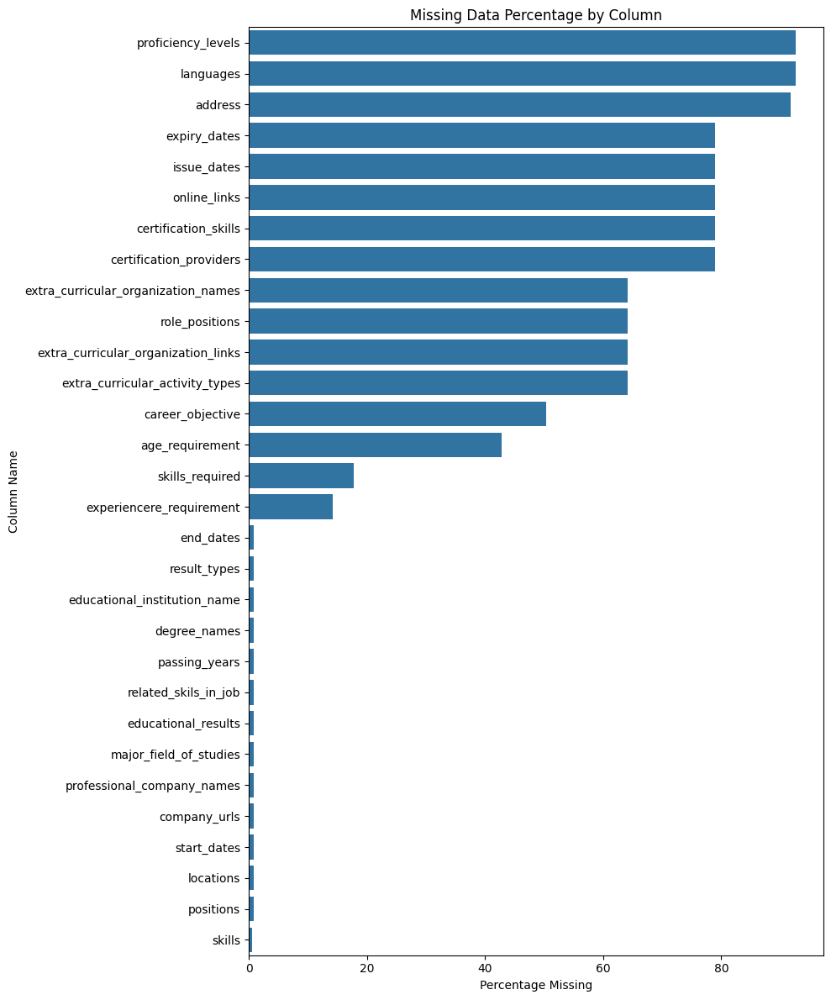

In [8]:
missing_percent = df.isnull().mean().sort_values(ascending=False) * 100
missing_df = missing_percent.reset_index()
missing_df.columns = ['Column', 'MissingPercentage']
missing_df = missing_df[missing_df['MissingPercentage'] > 0]

# Plot missing data percentages
plt.figure(figsize=(10, 12))
sns.barplot(data=missing_df, y='Column', x='MissingPercentage')
plt.title('Missing Data Percentage by Column')
plt.xlabel('Percentage Missing')
plt.ylabel('Column Name')
plt.tight_layout()
plt.show()

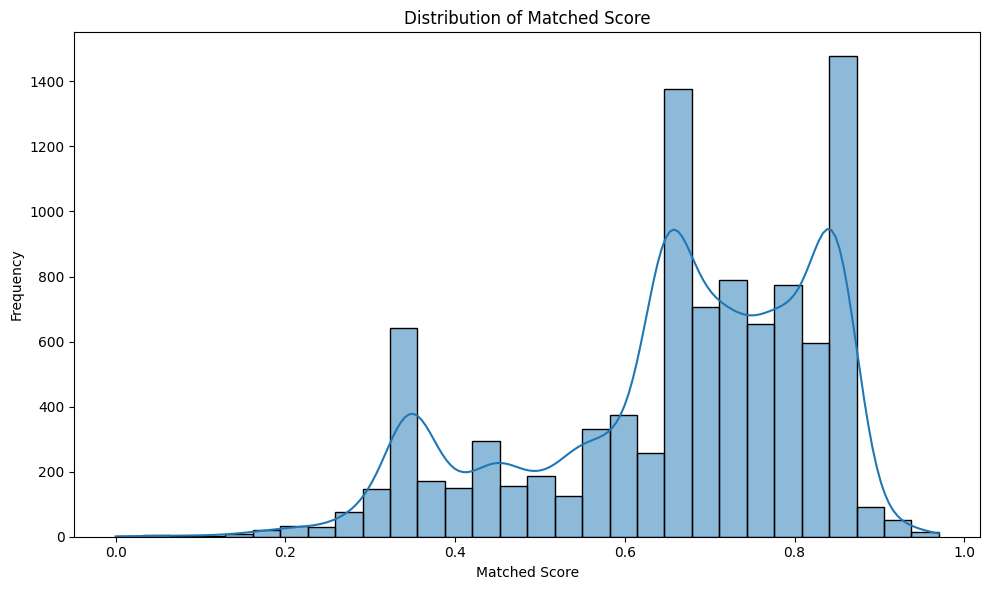

In [9]:
plt.figure(figsize=(10, 6))
sns.histplot(df['matched_score'], bins=30, kde=True)
plt.title('Distribution of Matched Score')
plt.xlabel('Matched Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [10]:
# Summary statistics of matched score
matched_score_stats = df['matched_score'].describe()
matched_score_stats

count    9544.000000
mean        0.660831
std         0.167040
min         0.000000
25%         0.583333
50%         0.683333
75%         0.793333
max         0.970000
Name: matched_score, dtype: float64

In [11]:
df.columns

Index(['address', 'career_objective', 'skills', 'educational_institution_name',
       'degree_names', 'passing_years', 'educational_results', 'result_types',
       'major_field_of_studies', 'professional_company_names', 'company_urls',
       'start_dates', 'end_dates', 'related_skils_in_job', 'positions',
       'locations', 'responsibilities', 'extra_curricular_activity_types',
       'extra_curricular_organization_names',
       'extra_curricular_organization_links', 'role_positions', 'languages',
       'proficiency_levels', 'certification_providers', 'certification_skills',
       'online_links', 'issue_dates', 'expiry_dates', 'job_position_name',
       'educational_requirements', 'experiencere_requirement',
       'age_requirement', 'responsibilities.1', 'skills_required',
       'matched_score'],
      dtype='object')

The responsibilities column is a duplicate and belongs to jobs. 
There are some columns that are not required because there are too many missing values and are not much related to the job postings.
1. responsibilities.1 - Duplicate
2. address
3. locations
4. extra_curricular_organization_links
5. online_links
6. issue_dates
7.  expiry_dates
8. company_urls

In [12]:
# Drop the columns that are not useful for analysis
df = df.drop(columns = ["responsibilities.1","address", "locations", "extra_curricular_organization_links", "online_links", "issue_dates", "expiry_dates", "company_urls"])
df

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,languages,proficiency_levels,certification_providers,certification_skills,job_position_name,educational_requirements,experiencere_requirement,age_requirement,skills_required,matched_score
0,Big data analytics working and database wareho...,"['Big Data', 'Hadoop', 'Hive', 'Python', 'Mapr...",['The Amity School of Engineering & Technology...,['B.Tech'],['2019'],['N/A'],[None],['Electronics'],['Coca-COla'],['Nov 2019'],...,NaN,NaN,NaN,NaN,Senior Software Engineer,B.Sc in Computer Science & Engineering from a ...,At least 1 year,NaN,NaN,0.850000
1,Fresher looking to join as a data analyst and ...,"['Data Analysis', 'Data Analytics', 'Business ...","['Delhi University - Hansraj College', 'Delhi ...","['B.Sc (Maths)', 'M.Sc (Science) (Statistics)']","['2015', '2018']","['N/A', 'N/A']","['N/A', 'N/A']","['Mathematics', 'Statistics']",['BIB Consultancy'],['Sep 2019'],...,NaN,NaN,NaN,NaN,Machine Learning (ML) Engineer,M.Sc in Computer Science & Engineering or in a...,At least 5 year(s),NaN,NaN,0.750000
2,NaN,"['Software Development', 'Machine Learning', '...","['Birla Institute of Technology (BIT), Ranchi']",['B.Tech'],['2018'],['N/A'],['N/A'],['Electronics/Telecommunication'],['Axis Bank Limited'],['June 2018'],...,NaN,NaN,NaN,NaN,"Executive/ Senior Executive- Trade Marketing, ...",Master of Business Administration (MBA),At least 3 years,NaN,Brand Promotion\nCampaign Management\nField Su...,0.416667
3,To obtain a position in a fast-paced business ...,"['accounts payables', 'accounts receivables', ...","['Martinez Adult Education, Business Training ...",['Computer Applications Specialist Certificate...,['2008'],[None],[None],['Computer Applications'],"['Company Name ï¼ City , State', 'Company Name...","['January 2011', 'January 2008', 'January 2006...",...,NaN,NaN,NaN,NaN,Business Development Executive,Bachelor/Honors,1 to 3 years,Age 22 to 30 years,Fast typing skill\nIELTSInternet browsing & on...,0.760000
4,Professional accountant with an outstanding wo...,"['Analytical reasoning', 'Compliance testing k...",['Kent State University'],['Bachelor of Business Administration'],[None],['3.84'],[None],['Accounting'],"['Company Name', 'Company Name', 'Company Name...","['January 2016', 'January 2016', 'January 2012...",...,NaN,NaN,['Ohio Notary Public'],[None],Senior iOS Engineer,Bachelor of Science (BSc) in Computer Science,At least 4 years,NaN,iOS\niOS App Developer\niOS Application Develo...,0.650000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,NaN,"['Mathematical modelling', 'Machine Learning',...",['Sanghvi College of Engineering'],['B.Tech'],['2019'],['N/A'],['N/A'],['N/A'],['BPM Foundation'],['Jun 2020'],...,NaN,NaN,NaN,NaN,Data Engineer,Bachelor of Science (BSc),5 to 8 years,NaN,Azure\nBig Data\nData Analytics\nETL Tools\nPo...,0.683333
9540,Expertise EDA modeler. I like to learn what my...,"['Data Analysis', 'Business Analysis', 'Machin...","['KVoCT, Pune', 'KVoCT, Pune']","['B.CA', 'M.CA']","['2018', '2020']","[None, None]","[None, None]","[None, None]",['Passionate Solution'],['Feb 2020'],...,NaN,NaN,NaN,NaN,Executive/ Sr. Executive -IT,Bachelor of Science (BSc) in Computer Science ...,3 to 5 years,Age at most 40 years,NaN,0.650000
9541,Looking for roles related to application devel...,"['Business Analyst', 'Data Analytics', 'Data C...",['PGG College Mysore'],['B.BA'],['2019'],['N/A'],['N/A'],['N/A'],['ZigSAW'],['Apr 2019'],...,NaN,NaN,NaN,NaN,Executive - VAT,BBA in Accounting and Finance,1 to 3 years,NaN,VAT and Tax,0.650000
9542,NaN,"['Machine Learning', 'Natural Language Process...","['Rajiv Gandhi Memorial University, Delhi']",['B.TECH'],['2020'],['N/A'],['N/A'],['Electrical'],['Zynta Labs'],['Apr 2019'],...,NaN,NaN,['Tensorflow and Keras'],[None],Asst. Manager/ Manger (Administrative),Bachelor/Honors,A

### Divide data to Resume, Jobs

The data contains columns from both resumes, jobs. We need to divide the data into separate files to analyze them individually.

In [13]:

resume_columns = ['career_objective', 'skills', 'educational_institution_name',
       'degree_names', 'passing_years', 'educational_results', 'result_types',
       'major_field_of_studies', 'professional_company_names',
       'start_dates', 'end_dates', 'related_skils_in_job', 'positions',
       'extra_curricular_activity_types',
       'extra_curricular_organization_names', 'role_positions', 'languages',
       'proficiency_levels', 'certification_providers', 'certification_skills']
job_columns = ['job_position_name', 'educational_requirements', 'responsibilities',
       'experiencere_requirement', 'age_requirement', 'skills_required']
resumes = df[resume_columns]
jobs = df[job_columns]

In [14]:
# Create a new column that combines all text columns into a single string for resumes and jobs
resumes["resume_text"] = resumes.astype(str).agg(" ".join, axis=1).str.strip()
jobs["jobs_text"] = jobs.astype(str).agg(" ".join, axis=1).str.strip()

/var/folders/pc/1fr1sz8j27l45vcjzqzbd_cm0000gn/T/ipykernel_18981/1348185225.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  resumes["resume_text"] = resumes.astype(str).agg(" ".join, axis=1).str.strip()
/var/folders/pc/1fr1sz8j27l45vcjzqzbd_cm0000gn/T/ipykernel_18981/1348185225.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jobs["jobs_text"] = jobs.astype(str).agg(" ".join, axis=1).str.strip()


In [15]:
# Get the unique resumes in the dataset
resumes_unique = resumes.drop_duplicates().reset_index(drop=True)
resumes_unique

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,related_skils_in_job,positions,extra_curricular_activity_types,extra_curricular_organization_names,role_positions,languages,proficiency_levels,certification_providers,certification_skills,resume_text
0,Big data analytics working and database wareho...,"['Big Data', 'Hadoop', 'Hive', 'Python', 'Mapr...",['The Amity School of Engineering & Technology...,['B.Tech'],['2019'],['N/A'],[None],['Electronics'],['Coca-COla'],['Nov 2019'],...,[['Big Data']],['Big Data Analyst'],NaN,NaN,NaN,NaN,NaN,NaN,NaN,Big data analytics working and database wareho...
1,Fresher looking to join as a data analyst and ...,"['Data Analysis', 'Data Analytics', 'Business ...","['Delhi University - Hansraj College', 'Delhi ...","['B.Sc (Maths)', 'M.Sc (Science) (Statistics)']","['2015', '2018']","['N/A', 'N/A']","['N/A', 'N/A']","['Mathematics', 'Statistics']",['BIB Consultancy'],['Sep 2019'],...,"[['Data Analysis', 'Business Analysis', 'Machi...",['Business Analyst'],NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fresher looking to join as a data analyst and ...
2,NaN,"['Software Development', 'Machine Learning', '...","['Birla Institute of Technology (BIT), Ranchi']",['B.Tech'],['2018'],['N/A'],['N/A'],['Electronics/Telecommunication'],['Axis Bank Limited'],['June 2018'],...,"[['Unified Payment Interface', 'Risk Predictio...",['Software Developer (Machine Learning Enginee...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"nan ['Software Development', 'Machine Learning..."
3,To obtain a position in a fast-paced business ...,"['accounts payables', 'accounts receivables', ...","['Martinez Adult Education, Business Training ...",['Computer Applications Specialist Certificate...,['2008'],[None],[None],['Computer Applications'],"['Company Name ï¼ City , State', 'Company Name...","['January 2011', 'January 2008', 'January 2006...",...,"[['accounts receivables', 'banking', 'G/L Acco...","['Accountant', 'Accounts Receivable Clerk', 'M...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,To obtain a position in a fast-paced business ...
4,Professional accountant with an outstanding wo...,"['Analytical reasoning', 'Compliance testing k...",['Kent State University'],['Bachelor of Business Administration'],[None],['3.84'],[None],['Accounting'],"['Company Name', 'Company Name', 'Company Name...","['January 2016', 'January 2016', 'January 2012...",...,"[['collections', 'accounts receivable', 'finan...","['Staff Accountant', 'Senior Accountant', 'Tax...","['Professional Organization', 'Honor Society',...","['Ohio Society of CPAs', 'Beta Alpha Psi', 'Go...","[None, None, None, None]",NaN,NaN,['Ohio Notary Public'],[None],Professional accountant with an outstanding wo...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339,Fresher starting out and wanting to join a rol...,"['Data Science', 'Data Analysis', 'Deep Learni...","['BGBS College, Mohantpur', 'BGBS College, Moh...","['BCA', 'MCA']","['2018', '2020']","[None, None]","[None, None]","[None, None]",['HiB Pvt Ltd'],['May 2019'],...,[['Recommender System']],['Intern'],['ACTIVITES'],[None],['Python statistics with Pandas and Matplotlib'],NaN,NaN,NaN,NaN,Fresher starting out and wanting to join a rol...
340,NaN,"['automation', 'budget', 'interpersonal', 'com...",NaN,NaN,NaN,NaN,NaN,NaN,"['Company Name', 'Company Name', 'Company Name...","['01/2008', '07/2007', '10/2001', '11/1999', '...",...,"[['engineering management', 'facility manageme...","['Facilities Engineering Manager', 'Field Engi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,"nan ['automation', 'budget', 'interpersonal', ..."
341,A business management graduate with significan...,"['accounting system', 'Accounts Payable', 'Adm...",['Bridgewater State University'],['Bachelor of Science'],['2015'],['N/A'],['N/A'],"['Business Management Accounting, Psychology']","['Company Name', 'Company Name', 'Company Name']","['12/2010'

In [16]:
resumes_unique.shape

(344, 21)

In [17]:
jobs_unique = jobs.drop_duplicates().reset_index(drop=True)
jobs_unique

,job_position_name,educational_requirements,responsibilities,experiencere_requirement,age_requirement,skills_required,jobs_text
0,Senior Software Engineer,B.Sc in Computer Science & Engineering from a ...,Technical Support\nTroubleshooting\nCollaborat...,At least 1 year,NaN,NaN,Senior Software Engineer B.Sc in Computer Scie...
1,Machine Learning (ML) Engineer,M.Sc in Computer Science & Engineering or in a...,Machine Learning Leadership\nCross-Functional ...,At least 5 year(s),NaN,NaN,Machine Learning (ML) Engineer M.Sc in Compute...
2,"Executive/ Senior Executive- Trade Marketing, ...",Master of Business Administration (MBA),"Trade Marketing Executive\nBrand Visibility, S...",At least 3 years,NaN,Brand Promotion\nCampaign Management\nField Su...,"Executive/ Senior Executive- Trade Marketing, ..."
3,Business Development Executive,Bachelor/Honors,Apparel Sourcing\nQuality Garment Sourcing\nRe...,1 to 3 years,Age 22 to 30 years,Fast typing skill\nIELTSInternet browsing & on...,Business Development Executive Bachelor/Honors...
4,Senior iOS Engineer,Bachelor of Science (BSc) in Computer Science,iOS Lifecycle\nRequirement Analysis\nNative Fr...,At least 4 years,NaN,iOS\niOS App Developer\niOS Application Develo...,Senior iOS Engineer Bachelor of Science (BSc) ...
5,AI Engineer,Bachelors or Masters degree in Computer Scienc...,Machine Learning Design\nData Analysis\nModel ...,NaN,NaN,Python\nR or Java\nTensorFlow\nPyTorch\nScikit...,AI Engineer Bachelors or Masters degree in Com...
6,Mechanical Engineer,Bachelor of Science (BSc) in Mechanical Engine...,Machinery Maintenance\nTroubleshooting\nReport...,2 to 5 years,Age 25 to 40 years,Maintenance and Troubleshooting\nMechanical,Mechanical Engineer Bachelor of Science (BSc) ...
7,Mechanical Designer,Bachelor’s degree in Mechanical Engineering fr...,Design Creation\nCAD Drawings\nDesign Optimiza...,At least 5 years,Age at least 24 years,AutoCAD\nSolidworks,Mechanical Designer Bachelor’s degree in Mecha...
8,Asst. Manager/ Manger (Administrative),Bachelor/Honors,Administrative Support\nScheduling\nFiling & D...,At least 5 years,Age at least 28 years,•Administration\n•Health Safety and Environmen...,Asst. Manager/ Manger (Administrative) Bachelo...
9,Database Administrator (DBA),Bachelor of Science (BSc) in Computer Science,Database Design & Development\nSQL Query Optim...,At least 1 year,Age 25 to 40 years,ASP.NET MVC Strong understanding of database d...,Database Administrator (DBA) Bachelor of Scien...


In [18]:
jobs_unique.shape

(28, 7)

From the data, we can see there are only 344 unique resumes, 28 jobs descriptions in the data.
Here, we will face a challenge with the limited data available to analyze resumes, jobs to extract any patterns in the data

### N gram analysis

In [19]:
from helper import *

In [20]:
jobs_unique.columns

Index(['job_position_name', 'educational_requirements', 'responsibilities',
       'experiencere_requirement', 'age_requirement', 'skills_required',
       'jobs_text'],
      dtype='object')

In [21]:
resumes_unique.columns

Index(['career_objective', 'skills', 'educational_institution_name',
       'degree_names', 'passing_years', 'educational_results', 'result_types',
       'major_field_of_studies', 'professional_company_names', 'start_dates',
       'end_dates', 'related_skils_in_job', 'positions',
       'extra_curricular_activity_types',
       'extra_curricular_organization_names', 'role_positions', 'languages',
       'proficiency_levels', 'certification_providers', 'certification_skills',
       'resume_text'],
      dtype='object')

In [22]:
get_ngram_frequencies(resumes_unique['resume_text'], n=3).head(25)

(nan, nan, nan)                    1292
(a, n, a)                           547
(n, a, n)                           546
(company, name, company)            490
(name, company, name)               490
(none, none, none)                  289
(bachelor, of, science)              76
(2019, n, a)                         62
(natural, language, processing)      53
(2020, n, a)                         42
(n, a, none)                         35
(institute, of, technology)          33
(2019, till, date)                   33
(b, tech, 2019)                      31
(engineer, nan, nan)                 30
(university, bachelor, of)           29
(machine, learning, data)            28
(machine, learning, engineer)        28
(engineering, company, name)         27
(n, a, nan)                          27
(a, nan, nan)                        26
(b, tech, 2020)                      26
(tech, 2019, n)                      25
(tech, 2020, n)                      24
(nan, nan, i)                        24


In [23]:
get_ngram_frequencies(jobs_unique['jobs_text'], n=4).head(25)

(bachelor, of, science, bsc)                8
(of, science, bsc, in)                      6
(years, age, 25, to)                        5
(in, computer, science, engineering)        5
(engineer, bachelor, of, science)           5
(bsc, in, computer, science)                4
(science, bsc, in, computer)                4
(5, years, age, at)                         4
(bachelor, of, business, administration)    3
(least, 5, years, age)                      3
(years, age, at, least)                     3
(at, least, 1, year)                        3
(at, least, 5, years)                       3
(of, business, administration, bba)         3
(from, a, reputed, university)              3
(engineering, from, a, reputed)             3
(25, to, 40, years)                         3
(age, 25, to, 40)                           3
(at, least, 3, years)                       3
(least, 3, years, nan)                      2
(computer, science, engineering, or)        2
(business, administration, bba, in


Generating Word Cloud for educational_requirements



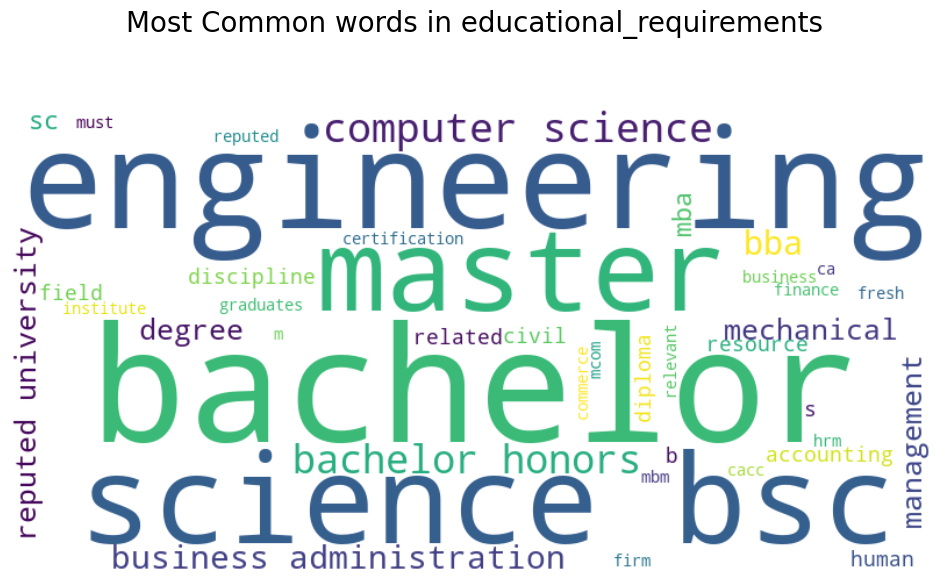

In [24]:
column_name = "educational_requirements"
text = process_skills_text(jobs_unique[column_name])
print(f"\nGenerating Word Cloud for {column_name}\n")
plot_wordcloud(text, f"Most Common words in {column_name}\n\n")


Generating Word Cloud for degree_names



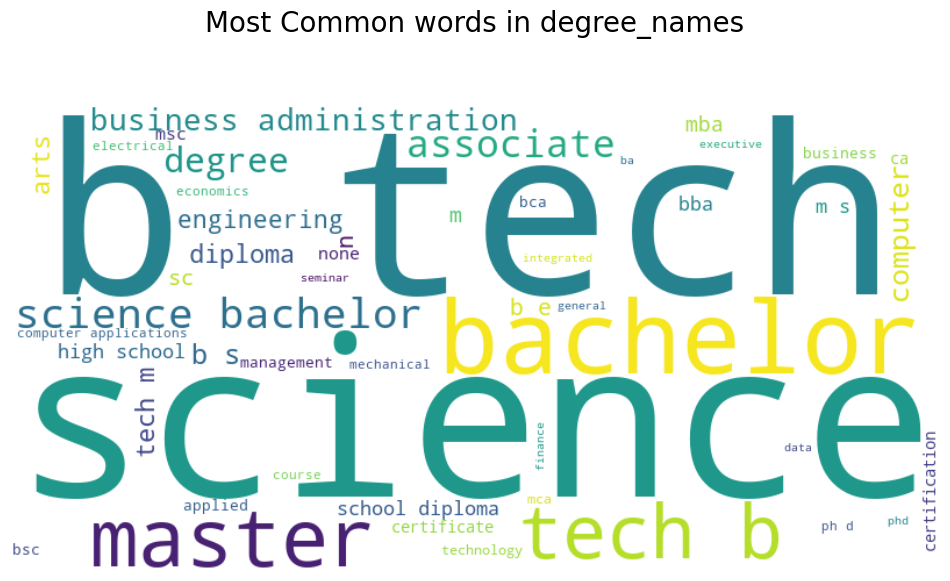

In [25]:
column_name = "degree_names"
text = process_skills_text(resumes_unique[column_name])
print(f"\nGenerating Word Cloud for {column_name}\n")
plot_wordcloud(text, f"Most Common words in {column_name}\n\n")


Generating Word Cloud for job_position_name



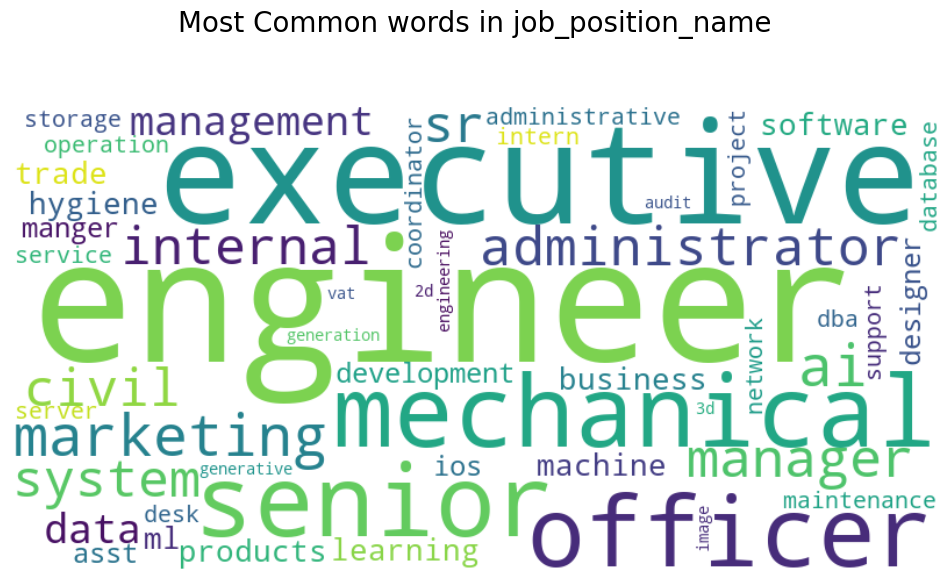

In [26]:
column_name = "job_position_name"
text = process_skills_text(jobs_unique[column_name])
print(f"\nGenerating Word Cloud for {column_name}\n")
plot_wordcloud(text, f"Most Common words in {column_name}\n\n")

In [27]:
# Print the unique values in columns to understand the data better
print_unique_values(resumes_unique['degree_names'])

Unique values in column 'degree_names':
A Level
B.Sc., Double major in Computer Science and Management
Grade 12 (School Certificate)
Poke-a-Yoke Certification
Executive Management
Master of Business Administration
Master of Science Degree
Business Certification
Master of Accountancy
Six Sigma Academy Greenbelt Training
J-500-0029, Marine Maintenance And Ship Repair 3-M System Coordinator/Inspector
Associate
B.S.
Course
Certificate of Business Administration
Associate of Science Degree
Masters of Business Administration
None
Mechanical-Industrial Engineering
B.A. General Studies
BSc
BA
Manufacturing Engineering Technology
Graduate Certificate
B.E. (Data Engineering)
Masters
Bachelor Business Administration
Doctor of Philosophy
Masters of Science
A.A.
B.Tech(Computers)
General Courses
Lean Certification (Parker Lean Boot Camp I, II, and III)
Masters of Science in Information Technology
MCA
Bachelor's degree
A.A.S
Bachelor of Engineering (B.E
Master of Science
Marketing Management Real Es

High level summary:

1. The dataset has 9544 rows and 35 columns.
2. There are 344 unique resumes and 28 unique jobs.
3. Target is matched_score. It has multi modal distribution with some right skewness. There are no outliers in the matched_score.
4. There are missing values in many columns - most in address, languages, proficiency levels, some of them are dropped.
5. There are many synonyms, acronyms in the data which need to be handled.

# Pre Processing and Feature Engineering

Before we go ahead with the analysis, we have to preprocess the data:

1. Lower casing - To avoid duplicates with casing
2. Remove stop words - Remove less important english stop words like "is, of, are, etc"
3. Handle synonyms, acronyms - Replace synonyms, acronyms with a consistant word
4. Lemmentation - Replace the words with base form - It improves the performance for similarity checking.
5. Remove duplicates - Removing duplicates will normalize the data giving equal importance to all remaining words and not their frequencies, but we will have to experiement with this method.
6. Remove HTML - Already dropped
7. Remove punctuations

### Resume, Job IDs

Since we have unique resumes, unique jobs, first we will need to merge them back. But, we will need to track the ids of the unique resumes, jobs. So, we will create job id, resume id.

In [28]:
resumes_unique.insert(0, 'resume_id', ['R' + str(i+1).zfill(3) for i in range(len(resumes_unique))])
jobs_unique.insert(0, 'job_id', ['J' + str(i+1).zfill(3) for i in range(len(jobs_unique))])
# Store the unique resumes, jobs in CSV files
resumes_unique.to_csv('../data/processed/resumes_unique.csv', index=False)
jobs_unique.to_csv('../data/processed/jobs_unique.csv', index=False)

In [29]:
# Merge the resumes and jobs dataframes with unique ids with the original dataset
df_with_resume_id = df.merge(resumes_unique, how="left", on=resume_columns)
df_with_ids = df_with_resume_id.merge(jobs_unique, how="left", on=job_columns)
df_with_ids

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,job_position_name,educational_requirements,experiencere_requirement,age_requirement,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text
0,Big data analytics working and database wareho...,"['Big Data', 'Hadoop', 'Hive', 'Python', 'Mapr...",['The Amity School of Engineering & Technology...,['B.Tech'],['2019'],['N/A'],[None],['Electronics'],['Coca-COla'],['Nov 2019'],...,Senior Software Engineer,B.Sc in Computer Science & Engineering from a ...,At least 1 year,NaN,NaN,0.850000,R001,Big data analytics working and database wareho...,J001,Senior Software Engineer B.Sc in Computer Scie...
1,Fresher looking to join as a data analyst and ...,"['Data Analysis', 'Data Analytics', 'Business ...","['Delhi University - Hansraj College', 'Delhi ...","['B.Sc (Maths)', 'M.Sc (Science) (Statistics)']","['2015', '2018']","['N/A', 'N/A']","['N/A', 'N/A']","['Mathematics', 'Statistics']",['BIB Consultancy'],['Sep 2019'],...,Machine Learning (ML) Engineer,M.Sc in Computer Science & Engineering or in a...,At least 5 year(s),NaN,NaN,0.750000,R002,Fresher looking to join as a data analyst and ...,J002,Machine Learning (ML) Engineer M.Sc in Compute...
2,NaN,"['Software Development', 'Machine Learning', '...","['Birla Institute of Technology (BIT), Ranchi']",['B.Tech'],['2018'],['N/A'],['N/A'],['Electronics/Telecommunication'],['Axis Bank Limited'],['June 2018'],...,"Executive/ Senior Executive- Trade Marketing, ...",Master of Business Administration (MBA),At least 3 years,NaN,Brand Promotion\nCampaign Management\nField Su...,0.416667,R003,"nan ['Software Development', 'Machine Learning...",J003,"Executive/ Senior Executive- Trade Marketing, ..."
3,To obtain a position in a fast-paced business ...,"['accounts payables', 'accounts receivables', ...","['Martinez Adult Education, Business Training ...",['Computer Applications Specialist Certificate...,['2008'],[None],[None],['Computer Applications'],"['Company Name ï¼ City , State', 'Company Name...","['January 2011', 'January 2008', 'January 2006...",...,Business Development Executive,Bachelor/Honors,1 to 3 years,Age 22 to 30 years,Fast typing skill\nIELTSInternet browsing & on...,0.760000,R004,To obtain a position in a fast-paced business ...,J004,Business Development Executive Bachelor/Honors...
4,Professional accountant with an outstanding wo...,"['Analytical reasoning', 'Compliance testing k...",['Kent State University'],['Bachelor of Business Administration'],[None],['3.84'],[None],['Accounting'],"['Company Name', 'Company Name', 'Company Name...","['January 2016', 'January 2016', 'January 2012...",...,Senior iOS Engineer,Bachelor of Science (BSc) in Computer Science,At least 4 years,NaN,iOS\niOS App Developer\niOS Application Develo...,0.650000,R005,Professional accountant with an outstanding wo...,J005,Senior iOS Engineer Bachelor of Science (BSc) ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,NaN,"['Mathematical modelling', 'Machine Learning',...",['Sanghvi College of Engineering'],['B.Tech'],['2019'],['N/A'],['N/A'],['N/A'],['BPM Foundation'],['Jun 2020'],...,Data Engineer,Bachelor of Science (BSc),5 to 8 years,NaN,Azure\nBig Data\nData Analytics\nETL Tools\nPo...,0.683333,R217,"nan ['Mathematical modelling', 'Machine Learni...",J021,Data Engineer Bachelor of Science (BSc) Data P...
9540,Expertise EDA modeler. I like to learn what my...,"['Data Analysis', 'Business Analysis', 'Machin...","['KVoCT, Pune', 'KVoCT, Pune']","['B.CA', 'M.CA']","['2018', '2020']","[None, None]","[None, None]","[None, None]",['Passionate Solution'],['Feb 2020'],...,Executive/ Sr. Executive -IT,Bachelor of Science (BSc) in Computer Science ...,3 to 5 years,Age at most 40 years,NaN,0.650000,R024,Expertise EDA modeler. I like to learn what my...,J013,Executive/ Sr. Executive -IT 

In [30]:
resumes = df_with_ids[resume_columns + ['resume_id']]
jobs = df_with_ids[job_columns + ['job_id']]

In [31]:
# Create a copy of the dataframe with ids for further processing
data = df_with_ids.copy()

### Total Experience Years

We have experience in numbers in resumes, jobs which is valuable for predicting matched score. But, TFIDF does not work great for numbers. So, we will extract the experience in resumes and minimum experience required in jobs and store them in separate columns.

In [33]:
from helper import *

In [34]:
data['total_experience'] = data.apply(calculate_resume_experience_from_lists, axis=1)

### Minimum required experience

In [35]:
# Fill NaN values in 'experiencere_requirement' with empty strings
data['experiencere_requirement'].fillna('', inplace=True)

/var/folders/pc/1fr1sz8j27l45vcjzqzbd_cm0000gn/T/ipykernel_61117/1134698068.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['experiencere_requirement'].fillna('', inplace=True)


In [36]:
data['min_experience_required'] = data['experiencere_requirement'].apply(extract_min_experience)

In [37]:
data

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,experiencere_requirement,age_requirement,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text,total_experience,min_experience_required
0,Big data analytics working and database wareho...,"['Big Data', 'Hadoop', 'Hive', 'Python', 'Mapr...",['The Amity School of Engineering & Technology...,['B.Tech'],['2019'],['N/A'],[None],['Electronics'],['Coca-COla'],['Nov 2019'],...,At least 1 year,NaN,NaN,0.850000,R001,Big data analytics working and database wareho...,J001,Senior Software Engineer B.Sc in Computer Scie...,4,1
1,Fresher looking to join as a data analyst and ...,"['Data Analysis', 'Data Analytics', 'Business ...","['Delhi University - Hansraj College', 'Delhi ...","['B.Sc (Maths)', 'M.Sc (Science) (Statistics)']","['2015', '2018']","['N/A', 'N/A']","['N/A', 'N/A']","['Mathematics', 'Statistics']",['BIB Consultancy'],['Sep 2019'],...,At least 5 year(s),NaN,NaN,0.750000,R002,Fresher looking to join as a data analyst and ...,J002,Machine Learning (ML) Engineer M.Sc in Compute...,5,5
2,NaN,"['Software Development', 'Machine Learning', '...","['Birla Institute of Technology (BIT), Ranchi']",['B.Tech'],['2018'],['N/A'],['N/A'],['Electronics/Telecommunication'],['Axis Bank Limited'],['June 2018'],...,At least 3 years,NaN,Brand Promotion\nCampaign Management\nField Su...,0.416667,R003,"nan ['Software Development', 'Machine Learning...",J003,"Executive/ Senior Executive- Trade Marketing, ...",6,3
3,To obtain a position in a fast-paced business ...,"['accounts payables', 'accounts receivables', ...","['Martinez Adult Education, Business Training ...",['Computer Applications Specialist Certificate...,['2008'],[None],[None],['Computer Applications'],"['Company Name ï¼ City , State', 'Company Name...","['January 2011', 'January 2008', 'January 2006...",...,1 to 3 years,Age 22 to 30 years,Fast typing skill\nIELTSInternet browsing & on...,0.760000,R004,To obtain a position in a fast-paced business ...,J004,Business Development Executive Bachelor/Honors...,14,1
4,Professional accountant with an outstanding wo...,"['Analytical reasoning', 'Compliance testing k...",['Kent State University'],['Bachelor of Business Administration'],[None],['3.84'],[None],['Accounting'],"['Company Name', 'Company Name', 'Company Name...","['January 2016', 'January 2016', 'January 2012...",...,At least 4 years,NaN,iOS\niOS App Developer\niOS Application Develo...,0.650000,R005,Professional accountant with an outstanding wo...,J005,Senior iOS Engineer Bachelor of Science (BSc) ...,16,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,NaN,"['Mathematical modelling', 'Machine Learning',...",['Sanghvi College of Engineering'],['B.Tech'],['2019'],['N/A'],['N/A'],['N/A'],['BPM Foundation'],['Jun 2020'],...,5 to 8 years,NaN,Azure\nBig Data\nData Analytics\nETL Tools\nPo...,0.683333,R217,"nan ['Mathematical modelling', 'Machine Learni...",J021,Data Engineer Bachelor of Science (BSc) Data P...,4,5
9540,Expertise EDA modeler. I like to learn what my...,"['Data Analysis', 'Business Analysis', 'Machin...","['KVoCT, Pune', 'KVoCT, Pune']","['B.CA', 'M.CA']","['2018', '2020']","[None, None]","[None, None]","[None, None]",['Passionate Solution'],['Feb 2020'],...,3 to 5 years,Age at most 40 years,NaN,0.650000,R024,Expertise EDA modeler. I like to learn what my...,J013,Executive/ Sr. Executive -IT Bachelor of Scien...,4,3
9541,Looking for roles related to application devel...,"['Business Analyst', 'Data Analytics', 'Data C...",['PGG College Mysore'],['B.BA'],['2019'],['N/A'],['N/A'],['N/A'],['ZigSAW'],['Apr 2019'],...,1 to 3 years,NaN,VAT and Tax,0.650000,R235,Looking for roles related to application devel...,J016,Executive - VAT BBA in Accounting and Finance ...,2,1
9542,NaN,"['Machine Learning', 'Natural Language Process...","['Rajiv Gandhi Me

### Fill None/Na values

In [38]:
placeholders = ["None", "none", "N/A", "n/a", "NA", "null", "Null", "-", "--", None, pd.NA, np.nan]

In [39]:
for col in data.columns:
    data[col] = data[col].replace(placeholders, "", regex=True)
    data[col] = data[col].fillna("")  # Handle actual NaNs as well

In [40]:
data

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,experiencere_requirement,age_requirement,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text,total_experience,min_experience_required
0,Big data analytics working and database wareho...,"['Big Data', 'Hadoop', 'Hive', 'Python', 'Mapr...",['The Amity School of Engineering & Technology...,['B.Tech'],['2019'],[''],[],['Electronics'],['CocaCOla'],['Nov 2019'],...,At least 1 year,,,0.850000,R001,Big data analytics working and database wareho...,J001,Senior Software Engineer B.Sc in Computer Scie...,4,1
1,Fresher looking to join as a data analyst and ...,"['Data Analysis', 'Data Analytics', 'Business ...","['Delhi University Hansraj College', 'Delhi U...","['B.Sc (Maths)', 'M.Sc (Science) (Statistics)']","['2015', '2018']","['', '']","['', '']","['Mathematics', 'Statistics']",['BIB Consultancy'],['Sep 2019'],...,At least 5 year(s),,,0.750000,R002,Fresher looking to join as a data analyst and ...,J002,Machine Learning (ML) Engineer M.Sc in Compute...,5,5
2,,"['Software Development', 'Machine Learning', '...","['Birla Institute of Technology (BIT), Ranchi']",['B.Tech'],['2018'],[''],[''],['Electronics/Telecommunication'],['Axis Bank Limited'],['June 2018'],...,At least 3 years,,Brand Promotion\nCampaign Management\nField Su...,0.416667,R003,"nan ['Software Development', 'Machine Learning...",J003,"Executive/ Senior Executive Trade Marketing, H...",6,3
3,To obtain a position in a fastpaced business o...,"['accounts payables', 'accounts receivables', ...","['Martinez Adult Education, Business Training ...",['Computer Applications Specialist Certificate...,['2008'],[],[],['Computer Applications'],"['Company Name ï¼ City , State', 'Company Name...","['January 2011', 'January 2008', 'January 2006...",...,1 to 3 years,Age 22 to 30 years,Fast typing skill\nIELTSInternet browsing & on...,0.760000,R004,To obtain a position in a fastpaced business o...,J004,Business Development Executive Bachelor/Honors...,14,1
4,Professional accountant with an outstanding wo...,"['Analytical reasoning', 'Compliance testing k...",['Kent State University'],['Bachelor of Business Administration'],[],['3.84'],[],['Accounting'],"['Company Name', 'Company Name', 'Company Name...","['January 2016', 'January 2016', 'January 2012...",...,At least 4 years,,iOS\niOS App Developer\niOS Application Develo...,0.650000,R005,Professional accountant with an outstanding wo...,J005,Senior iOS Engineer Bachelor of Science (BSc) ...,16,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,,"['Mathematical modelling', 'Machine Learning',...",['Sanghvi College of Engineering'],['B.Tech'],['2019'],[''],[''],[''],['BPM Foundation'],['Jun 2020'],...,5 to 8 years,,Azure\nBig Data\nData Analytics\nETL Tools\nPo...,0.683333,R217,"nan ['Mathematical modelling', 'Machine Learni...",J021,Data Engineer Bachelor of Science (BSc) Data P...,4,5
9540,Expertise EDA modeler. I like to learn what my...,"['Data Analysis', 'Business Analysis', 'Machin...","['KVoCT, Pune', 'KVoCT, Pune']","['B.CA', 'M.CA']","['2018', '2020']","[, ]","[, ]","[, ]",['Passionate Solution'],['Feb 2020'],...,3 to 5 years,Age at most 40 years,,0.650000,R024,Expertise EDA modeler. I like to learn what my...,J013,Executive/ Sr. Executive IT Bachelor of Scienc...,4,3
9541,Looking for roles related to application devel...,"['Business Analyst', 'Data Analytics', 'Data C...",['PGG College Mysore'],['B.BA'],['2019'],[''],[''],[''],['ZigSAW'],['Apr 2019'],...,1 to 3 years,,VAT and Tax,0.650000,R235,Looking for roles related to application devel...,J016,Executive VAT BBA in Accounting and Finance M...,2,1
9542,,"['Machine Learning', 'Natural Language Process...","['Rajiv Gandhi Memorial University, Delhi']",['B.TECH'],['2020'],[''],[''],['Electrical'],['Zynta Labs'],['Apr 2019'],...,At least 5 years,

In [53]:
data_df = data.copy()

### Lower case

In [54]:
# Convert all the columns to lower case
def to_lowercase(series):
    return series.str.lower()

In [55]:
for col in data_df.select_dtypes(include=['object']).columns:
    data_df[col] = to_lowercase(data_df[col])

In [56]:
data_df

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,experiencere_requirement,age_requirement,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text,total_experience,min_experience_required
0,big data analytics working and database wareho...,"['big data', 'hadoop', 'hive', 'python', 'mapr...",['the amity school of engineering & technology...,['b.tech'],['2019'],[''],[],['electronics'],['cocacola'],['nov 2019'],...,at least 1 year,,,0.850000,r001,big data analytics working and database wareho...,j001,senior software engineer b.sc in computer scie...,4,1
1,fresher looking to join as a data analyst and ...,"['data analysis', 'data analytics', 'business ...","['delhi university hansraj college', 'delhi u...","['b.sc (maths)', 'm.sc (science) (statistics)']","['2015', '2018']","['', '']","['', '']","['mathematics', 'statistics']",['bib consultancy'],['sep 2019'],...,at least 5 year(s),,,0.750000,r002,fresher looking to join as a data analyst and ...,j002,machine learning (ml) engineer m.sc in compute...,5,5
2,,"['software development', 'machine learning', '...","['birla institute of technology (bit), ranchi']",['b.tech'],['2018'],[''],[''],['electronics/telecommunication'],['axis bank limited'],['june 2018'],...,at least 3 years,,brand promotion\ncampaign management\nfield su...,0.416667,r003,"nan ['software development', 'machine learning...",j003,"executive/ senior executive trade marketing, h...",6,3
3,to obtain a position in a fastpaced business o...,"['accounts payables', 'accounts receivables', ...","['martinez adult education, business training ...",['computer applications specialist certificate...,['2008'],[],[],['computer applications'],"['company name ï¼ city , state', 'company name...","['january 2011', 'january 2008', 'january 2006...",...,1 to 3 years,age 22 to 30 years,fast typing skill\nieltsinternet browsing & on...,0.760000,r004,to obtain a position in a fastpaced business o...,j004,business development executive bachelor/honors...,14,1
4,professional accountant with an outstanding wo...,"['analytical reasoning', 'compliance testing k...",['kent state university'],['bachelor of business administration'],[],['3.84'],[],['accounting'],"['company name', 'company name', 'company name...","['january 2016', 'january 2016', 'january 2012...",...,at least 4 years,,ios\nios app developer\nios application develo...,0.650000,r005,professional accountant with an outstanding wo...,j005,senior ios engineer bachelor of science (bsc) ...,16,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,,"['mathematical modelling', 'machine learning',...",['sanghvi college of engineering'],['b.tech'],['2019'],[''],[''],[''],['bpm foundation'],['jun 2020'],...,5 to 8 years,,azure\nbig data\ndata analytics\netl tools\npo...,0.683333,r217,"nan ['mathematical modelling', 'machine learni...",j021,data engineer bachelor of science (bsc) data p...,4,5
9540,expertise eda modeler. i like to learn what my...,"['data analysis', 'business analysis', 'machin...","['kvoct, pune', 'kvoct, pune']","['b.ca', 'm.ca']","['2018', '2020']","[, ]","[, ]","[, ]",['passionate solution'],['feb 2020'],...,3 to 5 years,age at most 40 years,,0.650000,r024,expertise eda modeler. i like to learn what my...,j013,executive/ sr. executive it bachelor of scienc...,4,3
9541,looking for roles related to application devel...,"['business analyst', 'data analytics', 'data c...",['pgg college mysore'],['b.ba'],['2019'],[''],[''],[''],['zigsaw'],['apr 2019'],...,1 to 3 years,,vat and tax,0.650000,r235,looking for roles related to application devel...,j016,executive vat bba in accounting and finance m...,2,1
9542,,"['machine learning', 'natural language process...","['rajiv gandhi memorial university, delhi']",['b.tech'],['2020'],[''],[''],['electrical'],['zynta labs'],['apr 2019'],...,at least 5 years,

### Handle acronyms and synonyms

There are many synonyms and acronyms in the especially in degree names, job skills. These need to handled to get better performance with similarity scoring.

In [57]:
import json

In [58]:
# Replace MS in degree_names with master of science
data_df['degree_names'] = data_df['degree_names'].str.replace(r'\bms\b', 'master of science', regex=True)

In [60]:
# Open the json file containing the mapping
with open("synonym_json_cleaned.json", "r") as file:
    synonym_mapping = json.load(file)

In [61]:
# In all columns, check if keys in synonym_mapping are present and replace them with their values
def replace_synonyms(series, mapping):
    for key, value in mapping.items():
        series = series.str.replace(r'\b' + re.escape(key) + r'\b', value, regex=True)
    return series
for col in data_df.select_dtypes(include=['object']).columns:
    data_df[col] = replace_synonyms(data_df[col], synonym_mapping)

In [62]:
data_df

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,experiencere_requirement,age_requirement,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text,total_experience,min_experience_required
0,big data analytics working and database wareho...,"['big data', 'hadoop', 'hive', 'python', 'mapr...",['the amity school of engineering & technology...,['bachelor of technology'],['2019'],[''],[],['electronics'],['cocacola'],['november 2019'],...,at least 1 year,,,0.850000,r001,big data analytics working and database wareho...,j001,senior software engineer bachelor of science i...,4,1
1,fresher looking to join associate of science a...,"['data analysis', 'data analytics', 'business ...","['delhi university hansraj college', 'delhi u...","['bachelor of science (maths)', 'master of sci...","['2015', '2018']","['', '']","['', '']","['mathematics', 'statistics']",['bib consultancy'],['september 2019'],...,at least 5 year(s),,,0.750000,r002,fresher looking to join associate of science a...,j002,machine learning (machine learning) engineer m...,5,5
2,,"['software development', 'machine learning', '...","['birla institute of technology (bit), ranchi']",['bachelor of technology'],['2018'],[''],[''],['electronics/telecommunication'],['axis bank limited'],['june 2018'],...,at least 3 years,,brand promotion\ncampaign management\nfield su...,0.416667,r003,"nan ['software development', 'machine learning...",j003,"executive/ senior executive trade marketing, h...",6,3
3,to obtain a position in a fastpaced business o...,"['accounts payables', 'accounts receivables', ...","['martinez adult education, business training ...",['computer applications specialist certificate...,['2008'],[],[],['computer applications'],"['company name ï¼ city , state', 'company name...","['january 2011', 'january 2008', 'january 2006...",...,1 to 3 years,age 22 to 30 years,fast typing skill\nieltsinternet browsing & on...,0.760000,r004,to obtain a position in a fastpaced business o...,j004,business development executive bachelor/honors...,14,1
4,professional accountant with an outstanding wo...,"['analytical reasoning', 'compliance testing k...",['kent state university'],['bachelor of business administration'],[],['3.84'],[],['accounting'],"['company name', 'company name', 'company name...","['january 2016', 'january 2016', 'january 2012...",...,at least 4 years,,ios\nios app engineer\nios application develop...,0.650000,r005,professional accountant with an outstanding wo...,j005,senior ios engineer bachelor of science (bache...,16,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,,"['mathematical model', 'machine learning', 'pr...",['sanghvi college of engineering'],['bachelor of technology'],['2019'],[''],[''],[''],['bpm foundation'],['june 2020'],...,5 to 8 years,,azure\nbig data\ndata analytics\netl tools\npo...,0.683333,r217,"nan ['mathematical model', 'machine learning',...",j021,data engineer bachelor of science (bachelor of...,4,5
9540,expertise exploratory data analysis modeler. i...,"['data analysis', 'business analysis', 'machin...","['kvoct, pune', 'kvoct, pune']","['bachelor of computer applications', 'master ...","['2018', '2020']","[, ]","[, ]","[, ]",['passionate solution'],['february 2020'],...,3 to 5 years,age at most 40 years,,0.650000,r024,expertise exploratory data analysis modeler. i...,j013,executive/ senior. executive information techn...,4,3
9541,looking for roles related to application devel...,"['business analyst', 'data analytics', 'data c...",['pgg college mysore'],['bachelor of business administration'],['2019'],[''],[''],[''],['zigsaw'],['april 2019'],...,1 to 3 years,,value added tax and tax,0.650000,r235,looking for roles related to application devel...,j016,executive value added tax bachelor of busines...,2,1
9542,,"['machine learning', 'natural language process

In [63]:
print_unique_values(data['degree_names'])

Unique values in column 'degree_names':

A Level
B.Sc., Double major in Computer Science and Management
Grade 12 (School Certificate)
Executive Management
Master of Business Administration
Master of Science Degree
Business Certification
Master of Accountancy
Six Sigma Academy Greenbelt Training
Associate
Certificate of Business Administration
B.S.
Course
Associate of Science Degree
Masters of Business Administration
B.A. General Studies
BSc
BA
Manufacturing Engineering Technology
Graduate Certificate
B.E. (Data Engineering)
Masters
A6510118, Engineering Common Core
A6510120, Engineering Mechanical
Bachelor Business Administration
Doctor of Philosophy
Masters of Science
A.A.
B.Tech(Computers)
General Courses
Lean Certification (Parker Lean Boot Camp I, II, and III)
A6520240, SHIPBD GAGE CAL
J5000029, Marine Maintenance And Ship Repair 3M System Coordinator/Inspector
Masters of Science in Information Technology
MCA
Bachelor's degree
A.A.S
Bachelor of Engineering (B.E
Master of Science
Ma

In [65]:
print_unique_values(data_df['skills'])

Unique values in column 'skills':

a/p
sap r/3
marketing & sales
training material
energetic
architect end to end
jenkins
decision trees
people development
budgetary and policy development
streamlit
debit
interpretation
access
visual c++
clerical
accounts payable/accounts receivable
calbench
expert in mircrosoft office suite
mainframe
stories
skilled in the operation of workstations and servers
helioscope
staff training
erpsap
team work
ifrs
selfdirected
real time embedded systems
facility management
sales tax
sql server 2005
inventory
google docs
dataset management
logo
textpad
net, photo, agile, analyst
image freeway
http
the sales
clustering
strategy/planning
financial reporting
dropbox
learning algorithm
quest
dfmea
reconciling
determined
strong collaborative skills
variance analysis
training program implementation
educated
retail analytics
accounts payable & receivable
fluent in microsoft office, mircrosoft word, outlook, powerpoint
python
catboost
backup
home office
vision
lean m

### Stop words

In [66]:
# Remove stop words from the text columns
def remove_stop_words(text):
    if isinstance(text, str):
        return ' '.join([word for word in text.split() if word.lower() not in stop_words])
    return text

In [67]:
for col in data_df.select_dtypes(include=['object']).columns:
    data_df[col] = data_df[col].apply(remove_stop_words)

In [68]:
data_df

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,experiencere_requirement,age_requirement,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text,total_experience,min_experience_required
0,big data analytics working database warehouse ...,"['big data', 'hadoop', 'hive', 'python', 'mapr...",['the amity school engineering & technology (a...,['bachelor technology'],['2019'],[''],[],['electronics'],['cocacola'],['november 2019'],...,least 1 year,,,0.850000,r001,big data analytics working database warehouse ...,j001,senior software engineer bachelor science comp...,4,1
1,fresher looking join associate science data an...,"['data analysis', 'data analytics', 'business ...","['delhi university hansraj college', 'delhi un...","['bachelor science (maths)', 'master science (...","['2015', '2018']","['', '']","['', '']","['mathematics', 'statistics']",['bib consultancy'],['september 2019'],...,least 5 year(s),,,0.750000,r002,fresher looking join associate science data an...,j002,machine learning (machine learning) engineer m...,5,5
2,,"['software development', 'machine learning', '...","['birla institute technology (bit), ranchi']",['bachelor technology'],['2018'],[''],[''],['electronics/telecommunication'],['axis bank limited'],['june 2018'],...,least 3 years,,brand promotion campaign management field supe...,0.416667,r003,"nan ['software development', 'machine learning...",j003,"executive/ senior executive trade marketing, h...",6,3
3,obtain position fastpaced business office envi...,"['accounts payables', 'accounts receivables', ...","['martinez adult education, business training ...",['computer applications specialist certificate...,['2008'],[],[],['computer applications'],"['company name ï¼ city , state', 'company name...","['january 2011', 'january 2008', 'january 2006...",...,1 3 years,age 22 30 years,fast typing skill ieltsinternet browsing & onl...,0.760000,r004,obtain position fastpaced business office envi...,j004,business development executive bachelor/honors...,14,1
4,professional accountant outstanding work ethic...,"['analytical reasoning', 'compliance testing k...",['kent state university'],['bachelor business administration'],[],['3.84'],[],['accounting'],"['company name', 'company name', 'company name...","['january 2016', 'january 2016', 'january 2012...",...,least 4 years,,ios ios app engineer ios application developme...,0.650000,r005,professional accountant outstanding work ethic...,j005,senior ios engineer bachelor science (bachelor...,16,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,,"['mathematical model', 'machine learning', 'pr...",['sanghvi college engineering'],['bachelor technology'],['2019'],[''],[''],[''],['bpm foundation'],['june 2020'],...,5 8 years,,azure big data data analytics etl tools power ...,0.683333,r217,"nan ['mathematical model', 'machine learning',...",j021,data engineer bachelor science (bachelor scien...,4,5
9540,expertise exploratory data analysis modeler. l...,"['data analysis', 'business analysis', 'machin...","['kvoct, pune', 'kvoct, pune']","['bachelor computer applications', 'master com...","['2018', '2020']","[, ]","[, ]","[, ]",['passionate solution'],['february 2020'],...,3 5 years,age 40 years,,0.650000,r024,expertise exploratory data analysis modeler. l...,j013,executive/ senior. executive information techn...,4,3
9541,looking roles related application development ...,"['business analyst', 'data analytics', 'data c...",['pgg college mysore'],['bachelor business administration'],['2019'],[''],[''],[''],['zigsaw'],['april 2019'],...,1 3 years,,value added tax tax,0.650000,r235,looking roles related application development ...,j016,executive value added tax bachelor business ad...,2,1
9542,,"['machine learning', 'natural language process...","['rajiv gandhi memorial university, delhi']",['bache

### Remove punctuations

In [69]:
data_df = data_df.applymap(lambda x: re.sub(r'[^\w\s]', ' ', str(x)) if isinstance(x, str) else x)

/var/folders/pc/1fr1sz8j27l45vcjzqzbd_cm0000gn/T/ipykernel_61117/3226765540.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  data_df = data_df.applymap(lambda x: re.sub(r'[^\w\s]', ' ', str(x)) if isinstance(x, str) else x)


In [70]:
data_df

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,experiencere_requirement,age_requirement,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text,total_experience,min_experience_required
0,big data analytics working database warehouse ...,big data hadoop hive python mapr...,the amity school engineering technology a...,bachelor technology,2019,,,electronics,cocacola,november 2019,...,least 1 year,,,0.850000,r001,big data analytics working database warehouse ...,j001,senior software engineer bachelor science comp...,4,1
1,fresher looking join associate science data an...,data analysis data analytics business ...,delhi university hansraj college delhi un...,bachelor science maths master science ...,2015 2018,,,mathematics statistics,bib consultancy,september 2019,...,least 5 year s,,,0.750000,r002,fresher looking join associate science data an...,j002,machine learning machine learning engineer m...,5,5
2,,software development machine learning ...,birla institute technology bit ranchi,bachelor technology,2018,,,electronics telecommunication,axis bank limited,june 2018,...,least 3 years,,brand promotion campaign management field supe...,0.416667,r003,nan software development machine learning...,j003,executive senior executive trade marketing h...,6,3
3,obtain position fastpaced business office envi...,accounts payables accounts receivables ...,martinez adult education business training ...,computer applications specialist certificate...,2008,,,computer applications,company name ï¼ city state company name...,january 2011 january 2008 january 2006...,...,1 3 years,age 22 30 years,fast typing skill ieltsinternet browsing onl...,0.760000,r004,obtain position fastpaced business office envi...,j004,business development executive bachelor honors...,14,1
4,professional accountant outstanding work ethic...,analytical reasoning compliance testing k...,kent state university,bachelor business administration,,3 84,,accounting,company name company name company name...,january 2016 january 2016 january 2012...,...,least 4 years,,ios ios app engineer ios application developme...,0.650000,r005,professional accountant outstanding work ethic...,j005,senior ios engineer bachelor science bachelor...,16,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,,mathematical model machine learning pr...,sanghvi college engineering,bachelor technology,2019,,,,bpm foundation,june 2020,...,5 8 years,,azure big data data analytics etl tools power ...,0.683333,r217,nan mathematical model machine learning ...,j021,data engineer bachelor science bachelor scien...,4,5
9540,expertise exploratory data analysis modeler l...,data analysis business analysis machin...,kvoct pune kvoct pune,bachelor computer applications master com...,2018 2020,,,,passionate solution,february 2020,...,3 5 years,age 40 years,,0.650000,r024,expertise exploratory data analysis modeler l...,j013,executive senior executive information techn...,4,3
9541,looking roles related application development ...,business analyst data analytics data c...,pgg college mysore,bachelor business administration,2019,,,,zigsaw,april 2019,...,1 3 years,,value added tax tax,0.650000,r235,looking roles related application development ...,j016,executive value added tax bachelor business ad...,2,1
9542,,machine learning natural language process...,rajiv gandhi memorial university delhi,bachelor technology,2020,,,electrical,zynta labs,april 2019,...,least 5 years,age least 28 years,administration health safety environment sa...,0.650000,r267,nan machine learning natural language pro...,j009,asst manager manger administrative bachelo...,1,5


In [72]:
# Remove extra spaces in all columns
def remove_extra_spaces(text):
    if isinstance(text, str):
        return re.sub(r'\s+', ' ', text).strip()
    return text
for col in data_df.select_dtypes(include=['object']).columns:
    data_df[col] = data_df[col].apply(remove_extra_spaces)
data_df

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,experiencere_requirement,age_requirement,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text,total_experience,min_experience_required
0,big data analytics working database warehouse ...,big data hadoop hive python mapreduce spark ja...,the amity school engineering technology aset n...,bachelor technology,2019,,,electronics,cocacola,november 2019,...,least 1 year,,,0.850000,r001,big data analytics working database warehouse ...,j001,senior software engineer bachelor science comp...,4,1
1,fresher looking join associate science data an...,data analysis data analytics business analysis...,delhi university hansraj college delhi univers...,bachelor science maths master science science ...,2015 2018,,,mathematics statistics,bib consultancy,september 2019,...,least 5 year s,,,0.750000,r002,fresher looking join associate science data an...,j002,machine learning machine learning engineer mas...,5,5
2,,software development machine learning deep lea...,birla institute technology bit ranchi,bachelor technology,2018,,,electronics telecommunication,axis bank limited,june 2018,...,least 3 years,,brand promotion campaign management field supe...,0.416667,r003,nan software development machine learning deep...,j003,executive senior executive trade marketing hyg...,6,3
3,obtain position fastpaced business office envi...,accounts payables accounts receivables account...,martinez adult education business training cen...,computer applications specialist certificate p...,2008,,,computer applications,company name ï¼ city state company name ï¼ cit...,january 2011 january 2008 january 2006 january...,...,1 3 years,age 22 30 years,fast typing skill ieltsinternet browsing onlin...,0.760000,r004,obtain position fastpaced business office envi...,j004,business development executive bachelor honors...,14,1
4,professional accountant outstanding work ethic...,analytical reasoning compliance testing knowle...,kent state university,bachelor business administration,,3 84,,accounting,company name company name company name company...,january 2016 january 2016 january 2012 january...,...,least 4 years,,ios ios app engineer ios application developme...,0.650000,r005,professional accountant outstanding work ethic...,j005,senior ios engineer bachelor science bachelor ...,16,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,,mathematical model machine learning predictive...,sanghvi college engineering,bachelor technology,2019,,,,bpm foundation,june 2020,...,5 8 years,,azure big data data analytics etl tools power ...,0.683333,r217,nan mathematical model machine learning predic...,j021,data engineer bachelor science bachelor scienc...,4,5
9540,expertise exploratory data analysis modeler li...,data analysis business analysis machine learni...,kvoct pune kvoct pune,bachelor computer applications master computer...,2018 2020,,,,passionate solution,february 2020,...,3 5 years,age 40 years,,0.650000,r024,expertise exploratory data analysis modeler li...,j013,executive senior executive information technol...,4,3
9541,looking roles related application development ...,business analyst data analytics data cleansing...,pgg college mysore,bachelor business administration,2019,,,,zigsaw,april 2019,...,1 3 years,,value added tax tax,0.650000,r235,looking roles related application development ...,j016,executive value added tax bachelor business ad...,2,1
9542,,machine learning natural language processing d...,rajiv gandhi memorial university delhi,bachelor technology,2020,,,electrical,zynta labs,april 2019,...,least 5 years,age least 28 years,administration health safety environment safet...,0.650000,r267,nan machine learning natural language processi...,j009,asst manager manger administrative bachelor ho...,1,5


In [73]:
print_unique_values(data_df['degree_names'])

Unique values in column 'degree_names':

bachelor degree associate degree
bachelor technology master technology integrated
master business administration bachelor business administration
master arts bachelor arts associates applied science
food handler certificate high school diploma
bachelor business administration course high school diploma seminar seminar seminar
doctor business administration management d bachelor arts master business administration master business administration bachelor science computer science
bachelor business administration bachelor business administration master business administration
bachelor technology information technology
bachelor arts economics master arts economics correspondence distance learning
phd master science
bachelor science master science
associate s degree bachelor science
bachelor technology electrical engineering specialization computer science higher secondary high school
bachelor commerce post graduate diploma
masters business administra

### Lemmentation

In [74]:
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/krishnakalakonda/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/krishnakalakonda/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [75]:
# Apply lemmatization to the text columns
def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    if isinstance(text, str):
        return ' '.join([lemmatizer.lemmatize(word) for word in text.split()])
    return text

In [76]:
for col in data_df.select_dtypes(include=['object']).columns:
    data_df[col] = data_df[col].apply(lemmatize_text)

In [77]:
data_df

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,experiencere_requirement,age_requirement,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text,total_experience,min_experience_required
0,big data analytics working database warehouse ...,big data hadoop hive python mapreduce spark ja...,the amity school engineering technology aset n...,bachelor technology,2019,,,electronics,cocacola,november 2019,...,least 1 year,,,0.850000,r001,big data analytics working database warehouse ...,j001,senior software engineer bachelor science comp...,4,1
1,fresher looking join associate science data an...,data analysis data analytics business analysis...,delhi university hansraj college delhi univers...,bachelor science math master science science s...,2015 2018,,,mathematics statistic,bib consultancy,september 2019,...,least 5 year s,,,0.750000,r002,fresher looking join associate science data an...,j002,machine learning machine learning engineer mas...,5,5
2,,software development machine learning deep lea...,birla institute technology bit ranchi,bachelor technology,2018,,,electronics telecommunication,axis bank limited,june 2018,...,least 3 year,,brand promotion campaign management field supe...,0.416667,r003,nan software development machine learning deep...,j003,executive senior executive trade marketing hyg...,6,3
3,obtain position fastpaced business office envi...,account payable account receivables account pa...,martinez adult education business training cen...,computer application specialist certificate pr...,2008,,,computer application,company name ï¼ city state company name ï¼ cit...,january 2011 january 2008 january 2006 january...,...,1 3 year,age 22 30 year,fast typing skill ieltsinternet browsing onlin...,0.760000,r004,obtain position fastpaced business office envi...,j004,business development executive bachelor honor ...,14,1
4,professional accountant outstanding work ethic...,analytical reasoning compliance testing knowle...,kent state university,bachelor business administration,,3 84,,accounting,company name company name company name company...,january 2016 january 2016 january 2012 january...,...,least 4 year,,io io app engineer io application development ...,0.650000,r005,professional accountant outstanding work ethic...,j005,senior io engineer bachelor science bachelor s...,16,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,,mathematical model machine learning predictive...,sanghvi college engineering,bachelor technology,2019,,,,bpm foundation,june 2020,...,5 8 year,,azure big data data analytics etl tool power b...,0.683333,r217,nan mathematical model machine learning predic...,j021,data engineer bachelor science bachelor scienc...,4,5
9540,expertise exploratory data analysis modeler li...,data analysis business analysis machine learni...,kvoct pune kvoct pune,bachelor computer application master computer ...,2018 2020,,,,passionate solution,february 2020,...,3 5 year,age 40 year,,0.650000,r024,expertise exploratory data analysis modeler li...,j013,executive senior executive information technol...,4,3
9541,looking role related application development m...,business analyst data analytics data cleansing...,pgg college mysore,bachelor business administration,2019,,,,zigsaw,april 2019,...,1 3 year,,value added tax tax,0.650000,r235,looking role related application development m...,j016,executive value added tax bachelor business ad...,2,1
9542,,machine learning natural language processing d...,rajiv gandhi memorial university delhi,bachelor technology,2020,,,electrical,zynta lab,april 2019,...,least 5 year,age least 28 year,administration health safety environment safet...,0.650000,r267,nan machine learning natural language processi...,j009,asst manager manger administrative bachelor ho...,1,5


### Stemming

In [78]:
# # apply stemming to the text columns
# def stem_text(text):
#     stemmer = PorterStemmer()
#     if isinstance(text, str):
#         return ' '.join([stemmer.stem(word) for word in text.split()])
#     return text
# for col in data_df.select_dtypes(include=['object']).columns:
#     print(col)
#     data_df[col] = data_df[col].apply(stem_text)

In [79]:
data_df.columns

Index(['career_objective', 'skills', 'educational_institution_name',
       'degree_names', 'passing_years', 'educational_results', 'result_types',
       'major_field_of_studies', 'professional_company_names', 'start_dates',
       'end_dates', 'related_skils_in_job', 'positions', 'responsibilities',
       'extra_curricular_activity_types',
       'extra_curricular_organization_names', 'role_positions', 'languages',
       'proficiency_levels', 'certification_providers', 'certification_skills',
       'job_position_name', 'educational_requirements',
       'experiencere_requirement', 'age_requirement', 'skills_required',
       'matched_score', 'resume_id', 'resume_text', 'job_id', 'jobs_text',
       'total_experience', 'min_experience_required'],
      dtype='object')

In [80]:
# Recreate the resume and job text columns after preprocessing
resume_columns = ['career_objective', 'skills', 'educational_institution_name',
       'degree_names', 'passing_years', 'educational_results', 'result_types',
       'major_field_of_studies', 'professional_company_names',
       'start_dates', 'end_dates', 'related_skils_in_job', 'positions',
       'extra_curricular_activity_types',
       'extra_curricular_organization_names', 'role_positions', 'languages',
       'proficiency_levels', 'certification_providers', 'certification_skills']
job_columns = ['job_position_name', 'educational_requirements', 'responsibilities',
       'experiencere_requirement', 'age_requirement', 'skills_required']
# Create a new column that combines all the text from resume columns to one string
data_df['resume_text'] = data_df[resume_columns].astype(str).agg(' '.join, axis=1).str.strip()
# Create a new column that combines all the text from job columns to one string
data_df['jobs_text'] = data_df[job_columns].astype(str).agg(' '.join, axis=1).str.strip()

### Matching skills ratio

Matching skills ratio checks the ratio of required skills present in the job resume

In [81]:
matching_ratio = []
for index, row in data_df.iterrows():
    ratio = get_matching_skills_ratio(row['resume_text'], row['skills_required'])
    matching_ratio.append(ratio)

In [82]:
data_df["skills_matching_ratio"] = matching_ratio

### Overlapping words

This feature store the total number of matching words in resume text and jobs text.

In [83]:
# get the number of matching words in resume_text and jobs_text
def get_matching_words_count(resume_text, job_text):
    resume_words = set(resume_text.split())
    job_words = set(job_text.split())
    return len(resume_words.intersection(job_words))
data_df['matching_words_count'] = data_df.apply(
    lambda row: get_matching_words_count(row['resume_text'], row['jobs_text']), axis=1
)

In [84]:
data_df

,career_objective,skills,educational_institution_name,degree_names,passing_years,educational_results,result_types,major_field_of_studies,professional_company_names,start_dates,...,skills_required,matched_score,resume_id,resume_text,job_id,jobs_text,total_experience,min_experience_required,skills_matching_ratio,matching_words_count
0,big data analytics working database warehouse ...,big data hadoop hive python mapreduce spark ja...,the amity school engineering technology aset n...,bachelor technology,2019,,,electronics,cocacola,november 2019,...,,0.850000,r001,big data analytics working database warehouse ...,j001,senior software engineer bachelor science comp...,4,1,0.000000,4
1,fresher looking join associate science data an...,data analysis data analytics business analysis...,delhi university hansraj college delhi univers...,bachelor science math master science science s...,2015 2018,,,mathematics statistic,bib consultancy,september 2019,...,,0.750000,r002,fresher looking join associate science data an...,j002,machine learning machine learning engineer mas...,5,5,0.000000,10
2,,software development machine learning deep lea...,birla institute technology bit ranchi,bachelor technology,2018,,,electronics telecommunication,axis bank limited,june 2018,...,brand promotion campaign management field supe...,0.416667,r003,software development machine learning deep lea...,j003,executive senior executive trade marketing hyg...,6,3,0.000000,0
3,obtain position fastpaced business office envi...,account payable account receivables account pa...,martinez adult education business training cen...,computer application specialist certificate pr...,2008,,,computer application,company name ï¼ city state company name ï¼ cit...,january 2011 january 2008 january 2006 january...,...,fast typing skill ieltsinternet browsing onlin...,0.760000,r004,obtain position fastpaced business office envi...,j004,business development executive bachelor honor ...,14,1,0.375000,3
4,professional accountant outstanding work ethic...,analytical reasoning compliance testing knowle...,kent state university,bachelor business administration,,3 84,,accounting,company name company name company name company...,january 2016 january 2016 january 2012 january...,...,io io app engineer io application development ...,0.650000,r005,professional accountant outstanding work ethic...,j005,senior io engineer bachelor science bachelor s...,16,4,0.100000,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9539,,mathematical model machine learning predictive...,sanghvi college engineering,bachelor technology,2019,,,,bpm foundation,june 2020,...,azure big data data analytics etl tool power b...,0.683333,r217,mathematical model machine learning predictive...,j021,data engineer bachelor science bachelor scienc...,4,5,0.200000,5
9540,expertise exploratory data analysis modeler li...,data analysis business analysis machine learni...,kvoct pune kvoct pune,bachelor computer application master computer ...,2018 2020,,,,passionate solution,february 2020,...,,0.650000,r024,expertise exploratory data analysis modeler li...,j013,executive senior executive information technol...,4,3,0.000000,6
9541,looking role related application development m...,business analyst data analytics data cleansing...,pgg college mysore,bachelor business administration,2019,,,,zigsaw,april 2019,...,value added tax tax,0.650000,r235,looking role related application development m...,j016,executive value added tax bachelor business ad...,2,1,0.000000,4
9542,,machine learning natural language processing d...,rajiv gandhi memorial university delhi,bachelor technology,2020,,,electrical,zynta lab,april 2019,...,administration health safety environment safet...,0.650000,r267,machine learning natural language processing d...,j009,asst manager manger administrative bachelor ho...,1,5,0.000000,1


In [86]:
data_df.to_csv("resume_jobs.csv", index=False)

## Clustering

In this section, we will check the number of clusters present in the resume. We will analyze if we get any good results for clustering and if they are meaningful by observing the word clouds for those clusters.

In [87]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as shc
from sklearn.metrics import silhouette_score, completeness_score, homogeneity_score


In [120]:
tfidf = TfidfVectorizer(stop_words='english')

In [150]:
resume_texts = data_df[['resume_text']]
resume_texts

,resume_text
0,big data analytics working database warehouse ...
1,fresher looking join associate science data an...
2,software development machine learning deep lea...
3,obtain position fastpaced business office envi...
4,professional accountant outstanding work ethic...
...,...
9539,mathematical model machine learning predictive...
9540,expertise exploratory data analysis modeler li...
9541,looking role related application development m...
9542,machine learning natural language processing d...


In [153]:
resume_texts = resume_texts.drop_duplicates().reset_index(drop=True)
resume_texts

,resume_text
0,big data analytics working database warehouse ...
1,fresher looking join associate science data an...
2,software development machine learning deep lea...
3,obtain position fastpaced business office envi...
4,professional accountant outstanding work ethic...
...,...
339,fresher starting wanting join role machine lea...
340,automation budget interpersonal computer liter...
341,business management graduate significant exper...
342,software engineering sdlc data handling data w...


In [154]:
resume_tfidf = tfidf.fit_transform(resume_texts['resume_text'])
print("TF-IDF matrix shape:", resume_tfidf.shape)

TF-IDF matrix shape: (344, 4456)


In [155]:
resume_tfidf.toarray().sum(axis=1)

array([ 6.6357749 ,  5.70762292,  6.04741464,  7.83329508,  8.33791278,
        9.22882241,  4.17902896,  7.49962693,  7.48513936,  6.68450867,
        8.27446368,  5.13782158,  6.32412015,  9.83937543,  6.24689207,
        5.46348177,  6.62164032,  5.28469457,  5.95256226,  6.0992159 ,
        7.11125281,  6.30533373, 10.47981363,  6.6574427 ,  8.05060826,
        5.65371739,  9.71776245,  6.58857103,  7.07608735, 10.89439463,
        4.65942563,  6.07016151,  6.23008815,  5.68599387,  6.66456846,
        6.34302629,  6.84790006,  8.51493844,  7.21075709,  9.5968307 ,
        9.22228065,  7.20031554,  7.62510772,  6.25486669,  8.14368057,
        6.82684847,  6.40846617,  7.79287183,  8.77041198,  9.32318458,
        5.82310276,  6.85887475,  6.5572969 ,  5.165642  ,  7.41565235,
        5.29622185,  5.30537518,  6.16628174,  7.59122425,  6.24309914,
        6.64259776,  7.3752465 ,  7.8920557 ,  7.05213139,  8.81494216,
        6.33012038,  5.59012176,  5.74771379,  7.19086139,  6.07

In [156]:
resume_tfidf = resume_tfidf.toarray()

### PCA

we will use PCA for dimentionality reduction. We will use components such that we will retain atleast 95% of the data variance.

In [157]:
pca = PCA(n_components=0.97, random_state=42)
resume_pca_matrix = pca.fit_transform(resume_tfidf)

print(f"Original matrix shape: {resume_tfidf.shape}")
print(f"PCA-reduced matrix shape: {resume_pca_matrix.shape}")

Original matrix shape: (344, 4456)
PCA-reduced matrix shape: (344, 309)


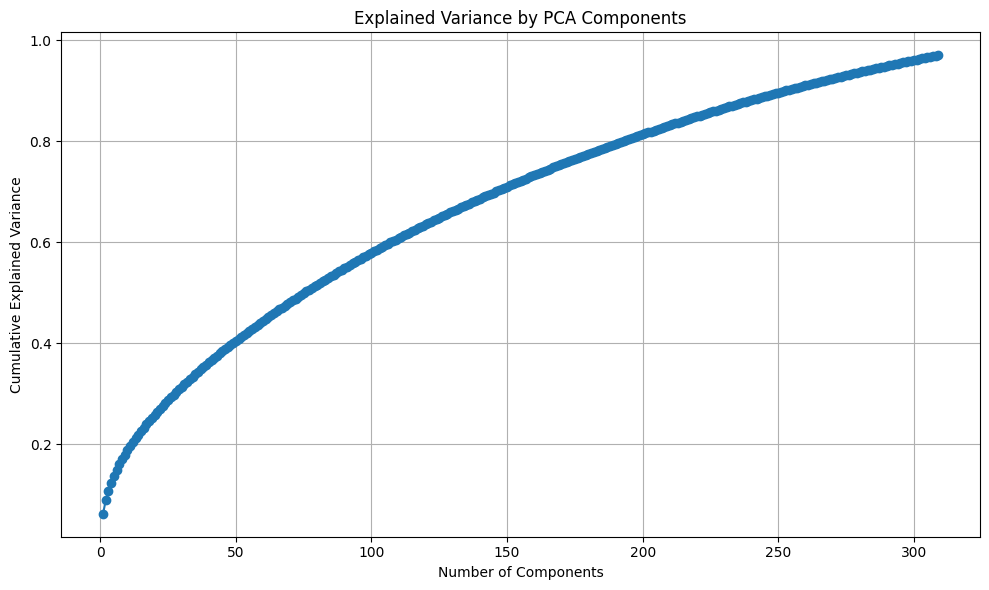

In [158]:
explained_variance = pca.explained_variance_ratio_.cumsum()
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o')
plt.title('Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.tight_layout()
plt.show()

In [159]:
def find_optimal_k(data, max_k):
    wss = [] # Within-Cluster-Sum-of-Squares
    silhouette_scores = []
    for i in range(2, max_k + 1):
        kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
        kmeans.fit(data)
        wss.append(kmeans.inertia_)
        if i > 1:
            silhouette_scores.append(silhouette_score(data, kmeans.labels_))
    # Plotting the WSS
    
    # Plotting the results
    plt.figure(figsize=(10, 6))
    plt.plot(range(2, max_k + 1), wss, marker='o', linestyle='--')
    plt.title('The Elbow Method')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('WSS (Inertia)')
    plt.xticks(range(2, max_k + 1))
    plt.grid(True)
    plt.show()
    # Plotting the silhouette scores
    plt.figure(figsize=(10, 6))
    plt.plot(range(2, max_k + 1), silhouette_scores, marker='o', linestyle='--')
    plt.title('Silhouette Score for Various Numbers of Clusters (k)')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.xticks(range(2, max_k + 1))
    plt.grid(True)
    plt.show()

Calculating optimal 'k' for PCA-reduced data...


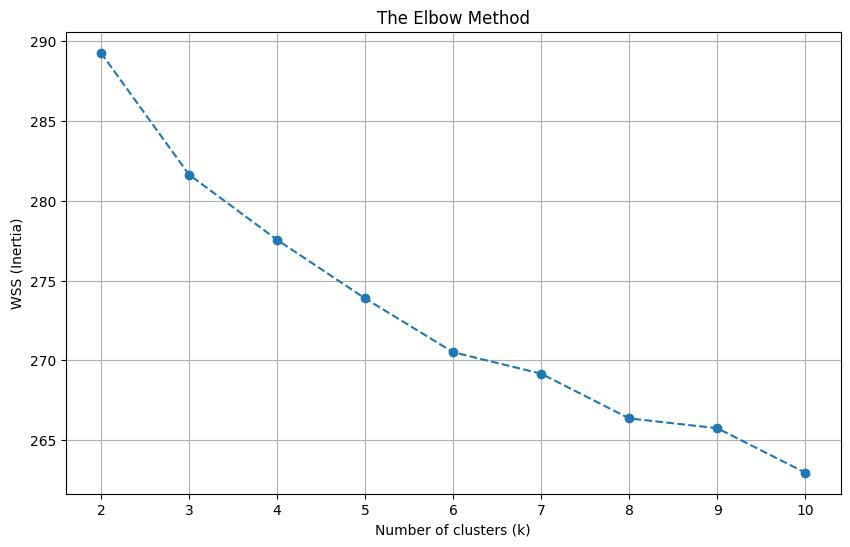

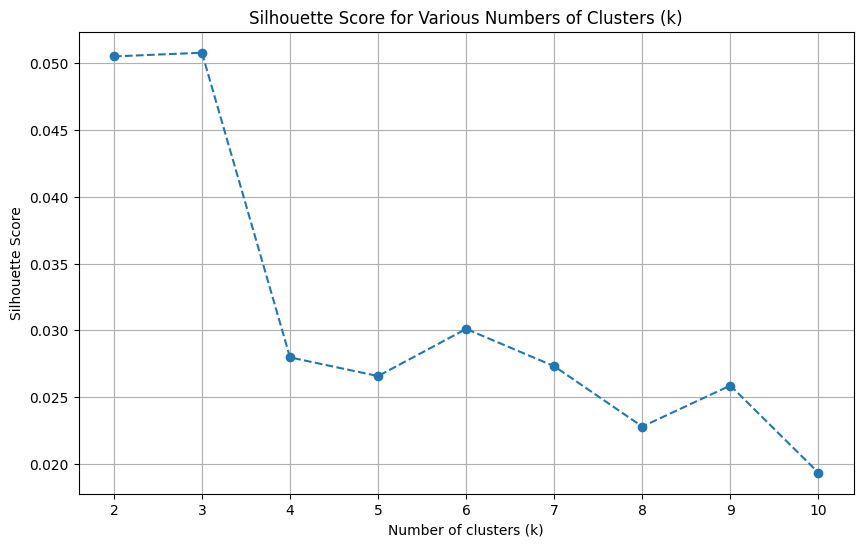

In [160]:
print("Calculating optimal 'k' for PCA-reduced data...")
find_optimal_k(resume_pca_matrix, max_k=10)

In [161]:
k_optimal = 6
kmeans = KMeans(n_clusters=k_optimal, init='k-means++', n_init=10, random_state=42)
kmeans.fit(resume_tfidf)

# Assign cluster labels back to the dataframe
resume_texts['Resume_Cluster_KMeans'] = kmeans.labels_
print(f"Assigned resumes to {k_optimal} clusters.")
print("\nCluster distribution:")
print(resume_texts['Resume_Cluster_KMeans'].value_counts())

Assigned resumes to 6 clusters.

Cluster distribution:
Resume_Cluster_KMeans
2    95
5    82
1    63
3    46
4    29
0    29
Name: count, dtype: int64


In [162]:
def plot_cluster_word_clouds(kmeans_model, tfidf_vectorizer, n_clusters):
    print("\nTop terms per cluster:")
    order_centroids = kmeans_model.cluster_centers_.argsort()[:, ::-1]
    terms = tfidf_vectorizer.get_feature_names_out()
    
    for i in range(n_clusters):
        top_terms_list = [terms[ind] for ind in order_centroids[i, :20]]
        top_terms_str = " ".join(top_terms_list)
        
        print(f"Cluster {i}: {', '.join(top_terms_list[:10])}\n")
        
        wordcloud = WordCloud(width=600, height=300, background_color='white').generate(top_terms_str)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Word Cloud for Cluster {i}")
        plt.show()

In [163]:
import os

In [164]:
def plot_and_save_cluster_word_clouds(kmeans_model, tfidf_vectorizer, n_clusters):

    print(f"\n===== Analysis for k={n_clusters} =====")
    
    # Define the base directory for saving images
    base_save_dir = f'../docs/KMeans/K{n_clusters}'
    # Create the directory if it doesn't exist
    os.makedirs(base_save_dir, exist_ok=True)
    
    # Get the top terms for each cluster from the model's centroids
    order_centroids = kmeans_model.cluster_centers_.argsort()[:, ::-1]
    terms = tfidf_vectorizer.get_feature_names_out()
    
    for i in range(n_clusters):
        top_terms_list = [terms[ind] for ind in order_centroids[i, :20]]
        top_terms_str = " ".join(top_terms_list)
        
        print(f"\nCluster {i}: {', '.join(top_terms_list[:10])}")
        
        wordcloud = WordCloud(width=600, height=300, background_color='white').generate(top_terms_str)
        
        fig = plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Word Cloud for Cluster {i} (k={n_clusters})")
        
        # Define the full path to save the image
        save_path = os.path.join(base_save_dir, f'cluster_{i}.png')
        # Save the figure before showing it
        plt.savefig(save_path, bbox_inches='tight')
        print(f"  -> Saved word cloud to: {save_path}")
        
        plt.show() # Display the plot in the notebook
        plt.close(fig) # Close the figure to free up memory


===== Analysis for k=2 =====

Cluster 0: data, learning, machine, 2019, technology, python, 2020, analysis, processing, analytics
  -> Saved word cloud to: ../docs/KMeans/K2/cluster_0.png


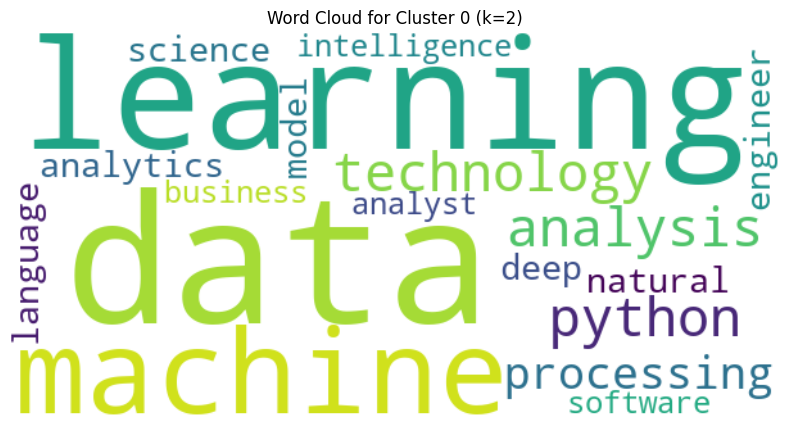


Cluster 1: company, management, accounting, engineering, financial, science, sale, account, january, university
  -> Saved word cloud to: ../docs/KMeans/K2/cluster_1.png


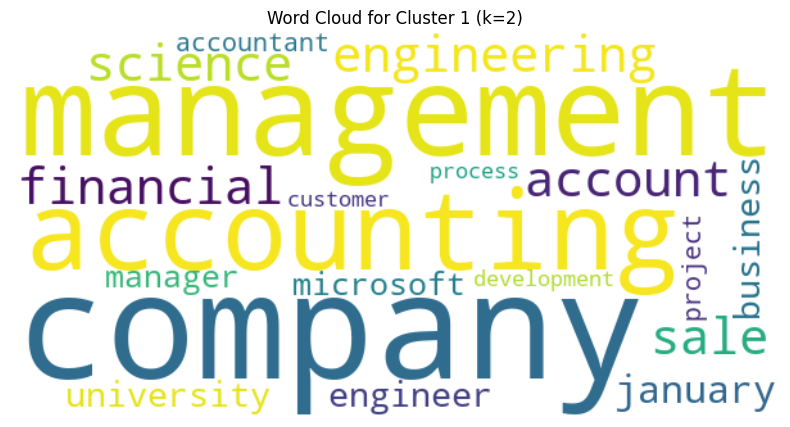


===== Analysis for k=3 =====

Cluster 0: data, learning, machine, 2019, technology, python, 2020, analysis, processing, analytics
  -> Saved word cloud to: ../docs/KMeans/K3/cluster_0.png


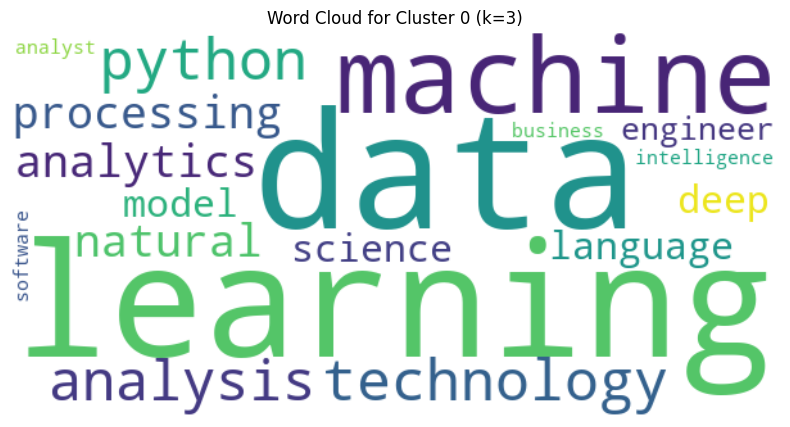


Cluster 1: company, management, engineering, science, engineer, sale, development, 01, project, university
  -> Saved word cloud to: ../docs/KMeans/K3/cluster_1.png


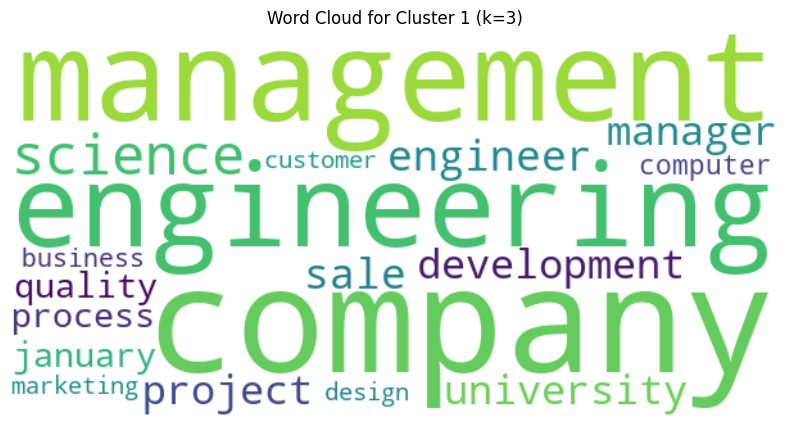


Cluster 2: accounting, financial, accountant, account, company, tax, reconciliation, ledger, statement, general
  -> Saved word cloud to: ../docs/KMeans/K3/cluster_2.png


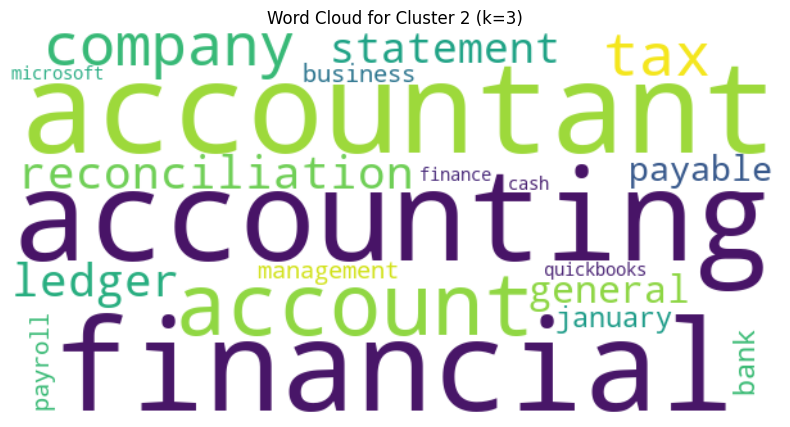


===== Analysis for k=4 =====

Cluster 0: data, learning, analysis, machine, 2020, 2019, analytics, python, model, intelligence
  -> Saved word cloud to: ../docs/KMeans/K4/cluster_0.png


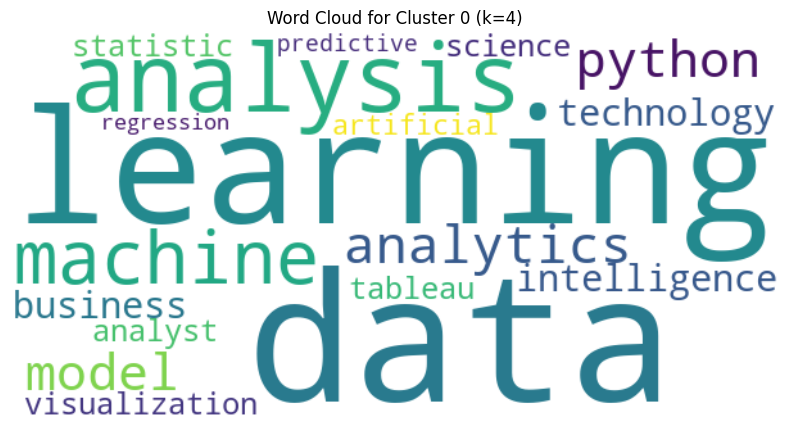


Cluster 1: company, management, engineering, science, engineer, sale, development, 01, project, university
  -> Saved word cloud to: ../docs/KMeans/K4/cluster_1.png


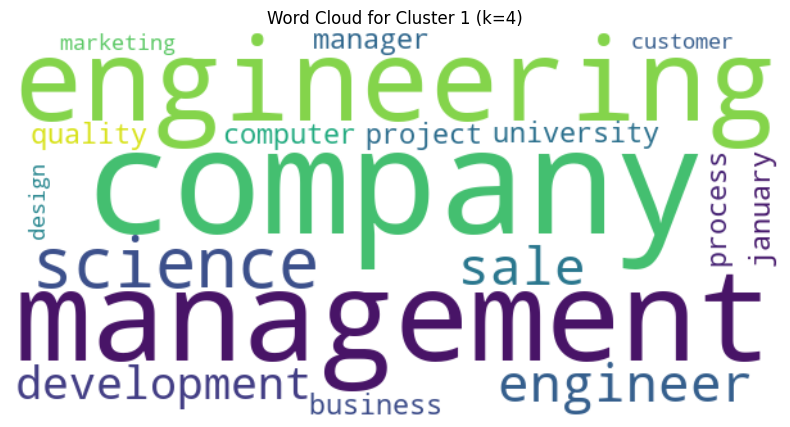


Cluster 2: accounting, financial, accountant, account, company, tax, reconciliation, ledger, statement, general
  -> Saved word cloud to: ../docs/KMeans/K4/cluster_2.png


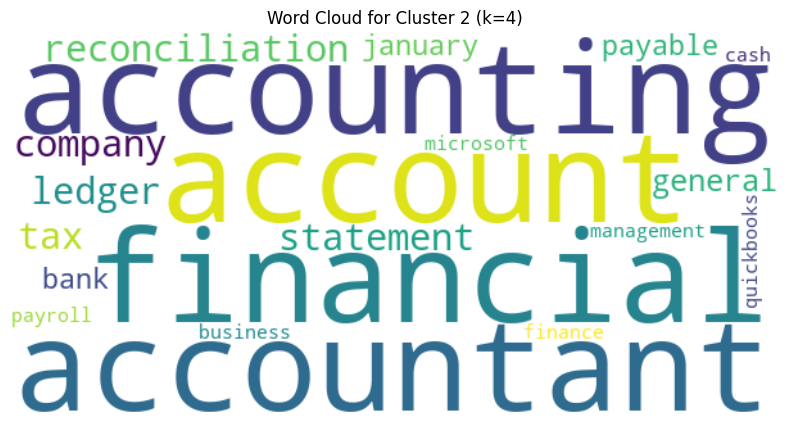


Cluster 3: learning, machine, data, processing, 2019, natural, language, technology, python, deep
  -> Saved word cloud to: ../docs/KMeans/K4/cluster_3.png


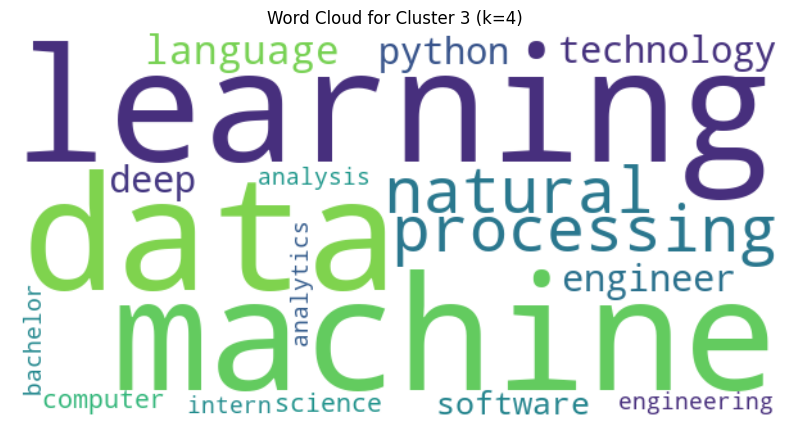


===== Analysis for k=5 =====

Cluster 0: management, company, sale, marketing, business, manager, development, 01, project, customer
  -> Saved word cloud to: ../docs/KMeans/K5/cluster_0.png


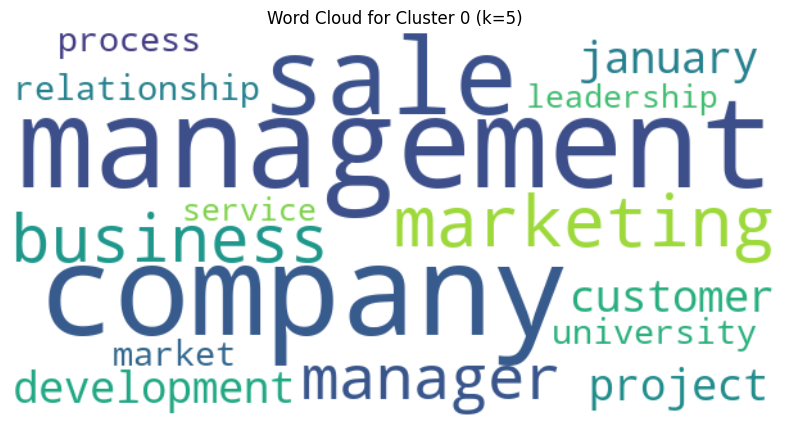


Cluster 1: company, engineering, engineer, science, management, computer, university, quality, electrical, troubleshooting
  -> Saved word cloud to: ../docs/KMeans/K5/cluster_1.png


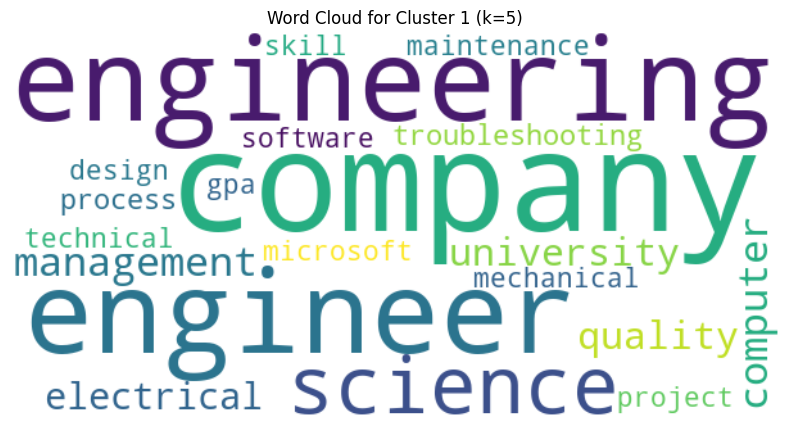


Cluster 2: learning, machine, technology, 2019, data, software, engineer, deep, 2020, processing
  -> Saved word cloud to: ../docs/KMeans/K5/cluster_2.png


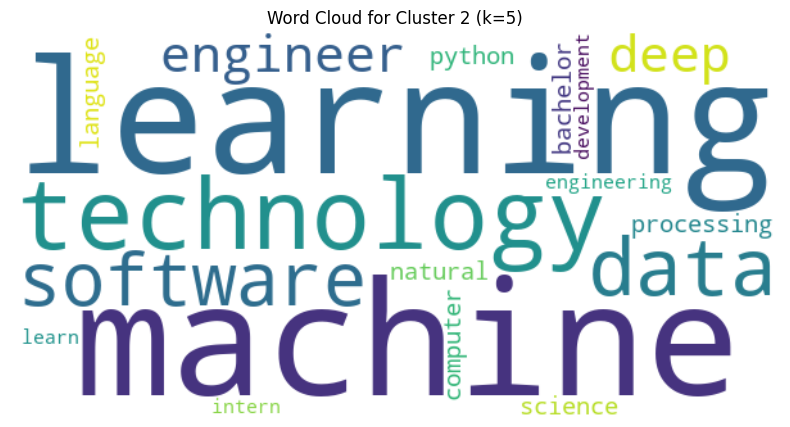


Cluster 3: accounting, financial, accountant, account, company, tax, reconciliation, ledger, statement, general
  -> Saved word cloud to: ../docs/KMeans/K5/cluster_3.png


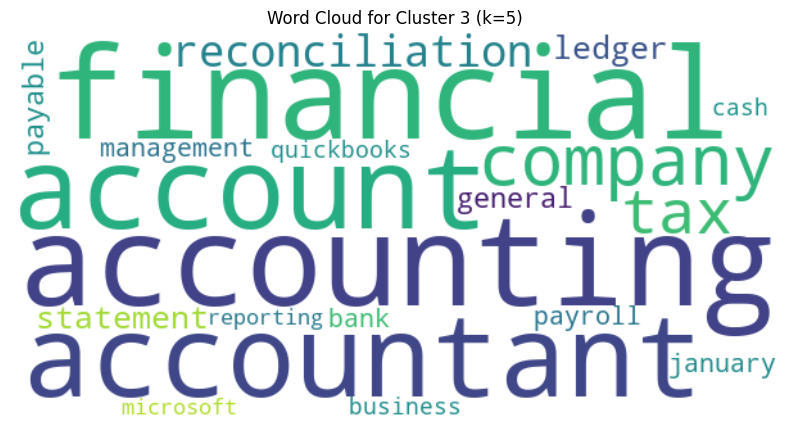


Cluster 4: data, learning, analysis, machine, analytics, python, 2019, 2020, model, business
  -> Saved word cloud to: ../docs/KMeans/K5/cluster_4.png


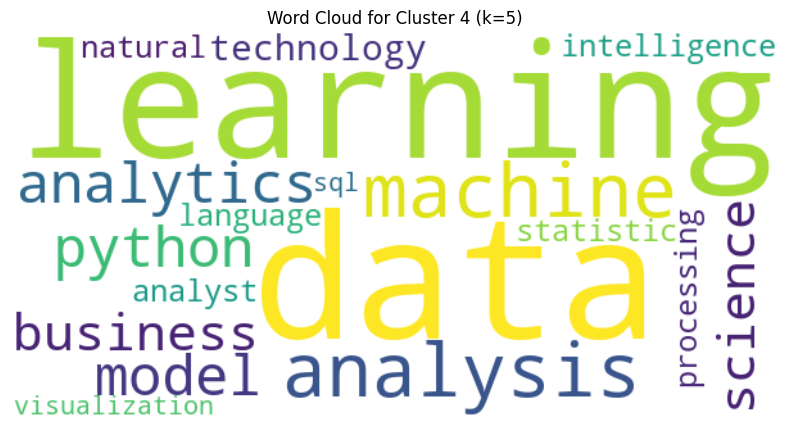


===== Analysis for k=6 =====

Cluster 0: computer, science, university, javascript, 20xx, html, 2021, engineer, research, visual
  -> Saved word cloud to: ../docs/KMeans/K6/cluster_0.png


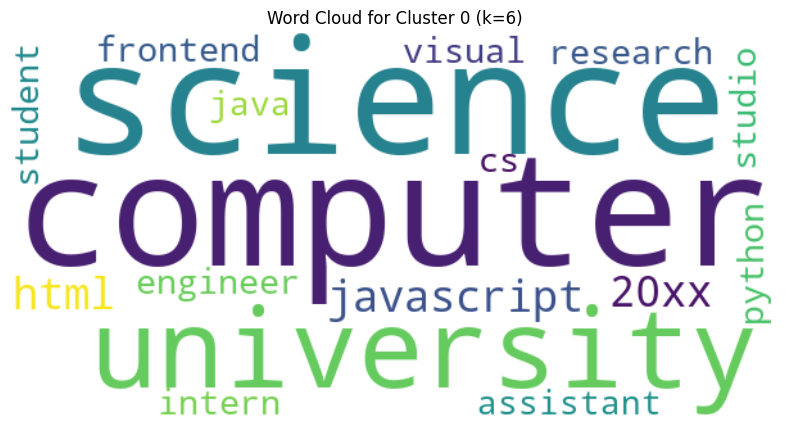


Cluster 1: data, analysis, learning, machine, 2020, business, analytics, intelligence, 2019, model
  -> Saved word cloud to: ../docs/KMeans/K6/cluster_1.png


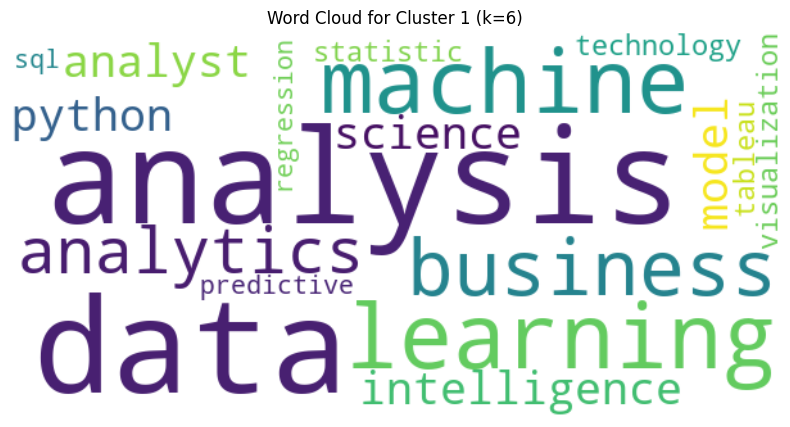


Cluster 2: company, engineering, management, engineer, project, quality, process, mechanical, design, microsoft
  -> Saved word cloud to: ../docs/KMeans/K6/cluster_2.png


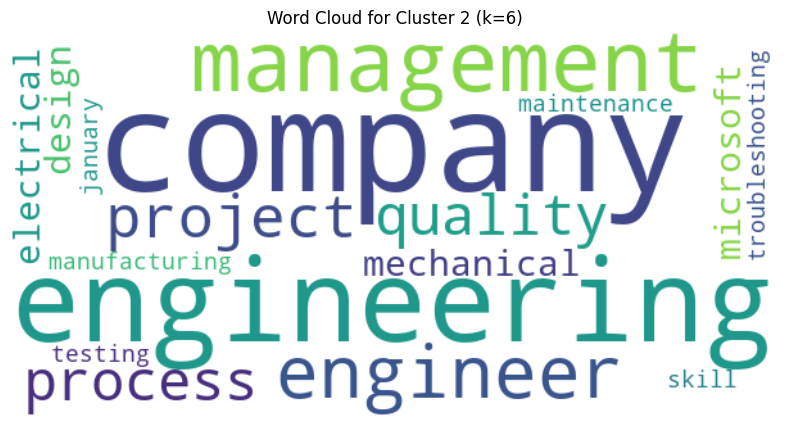


Cluster 3: accounting, financial, accountant, account, company, tax, reconciliation, ledger, statement, general
  -> Saved word cloud to: ../docs/KMeans/K6/cluster_3.png


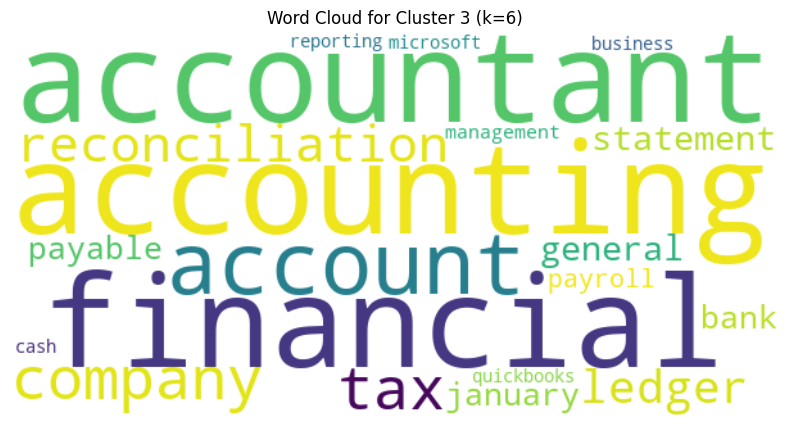


Cluster 4: sale, management, marketing, company, business, development, manager, 01, customer, relationship
  -> Saved word cloud to: ../docs/KMeans/K6/cluster_4.png


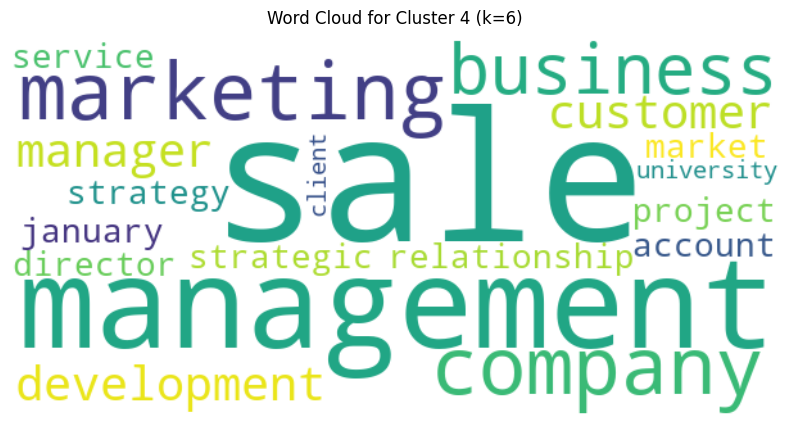


Cluster 5: learning, machine, data, 2019, processing, technology, natural, language, python, deep
  -> Saved word cloud to: ../docs/KMeans/K6/cluster_5.png


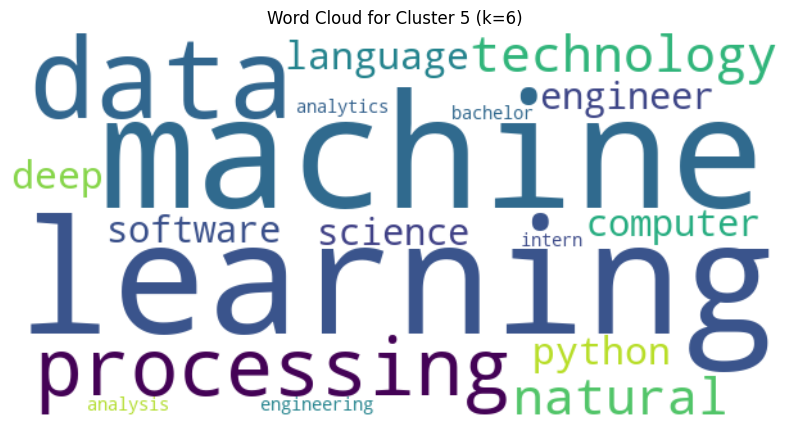


===== Analysis for k=7 =====

Cluster 0: computer, science, university, 2021, research, javascript, 2018, python, html, 20xx
  -> Saved word cloud to: ../docs/KMeans/K7/cluster_0.png


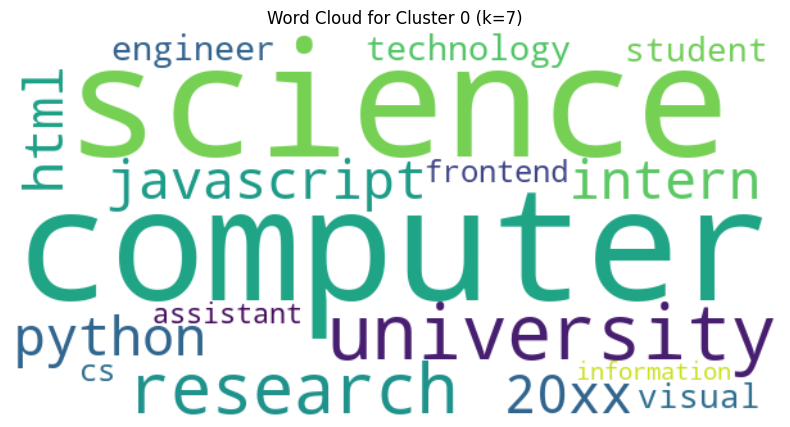


Cluster 1: sale, marketing, company, management, business, development, customer, 01, manager, relationship
  -> Saved word cloud to: ../docs/KMeans/K7/cluster_1.png


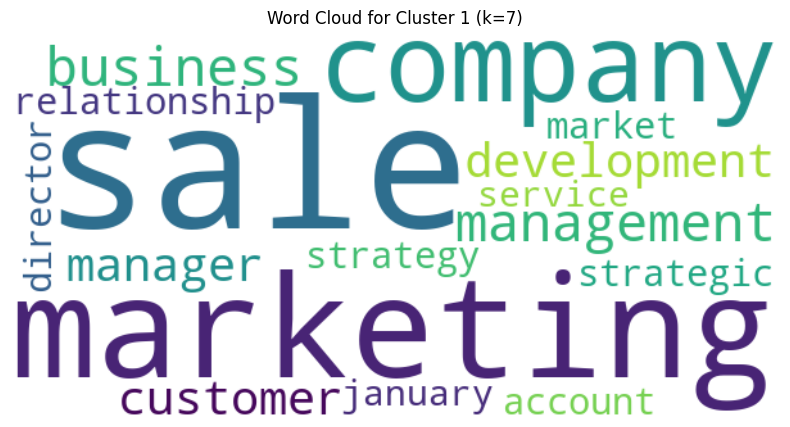


Cluster 2: data, learning, analysis, machine, analytics, 2019, 2020, python, business, technology
  -> Saved word cloud to: ../docs/KMeans/K7/cluster_2.png


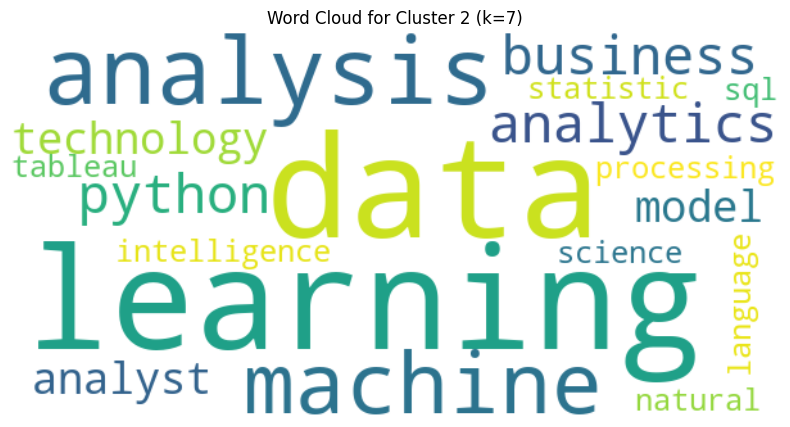


Cluster 3: accounting, financial, accountant, account, company, tax, reconciliation, ledger, statement, general
  -> Saved word cloud to: ../docs/KMeans/K7/cluster_3.png


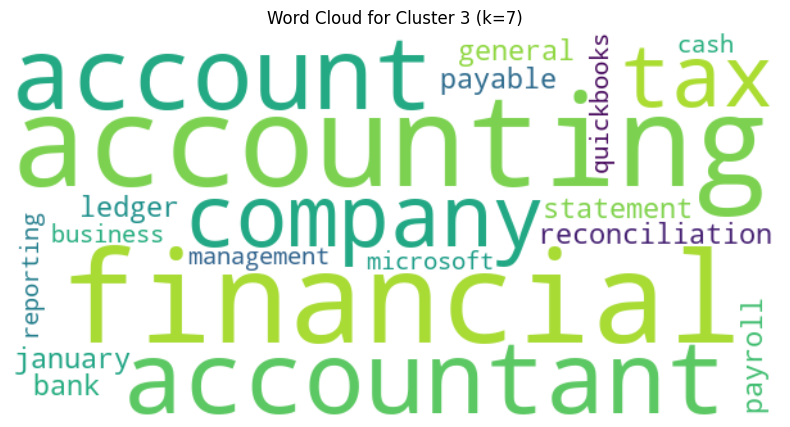


Cluster 4: learning, machine, 2019, technology, engineer, software, data, processing, python, deep
  -> Saved word cloud to: ../docs/KMeans/K7/cluster_4.png


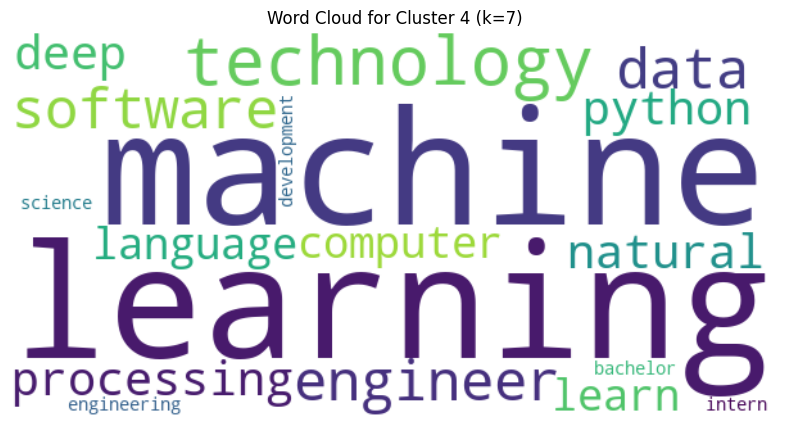


Cluster 5: company, engineering, engineer, quality, management, troubleshooting, mechanical, electrical, maintenance, process
  -> Saved word cloud to: ../docs/KMeans/K7/cluster_5.png


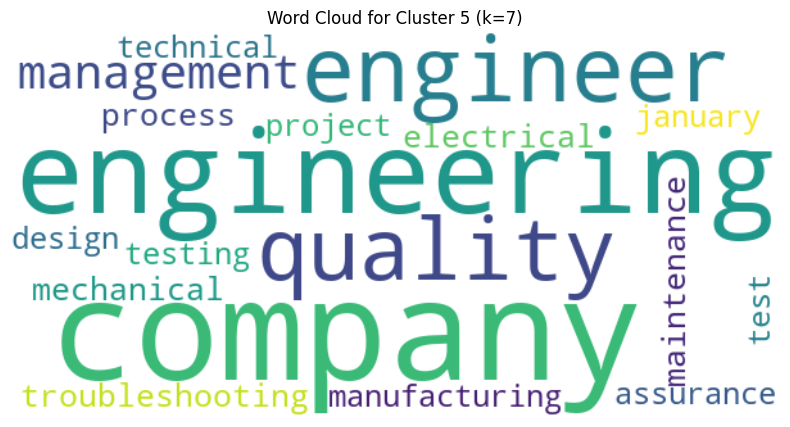


Cluster 6: management, company, project, engineering, manager, microsoft, 2015, skill, development, design
  -> Saved word cloud to: ../docs/KMeans/K7/cluster_6.png


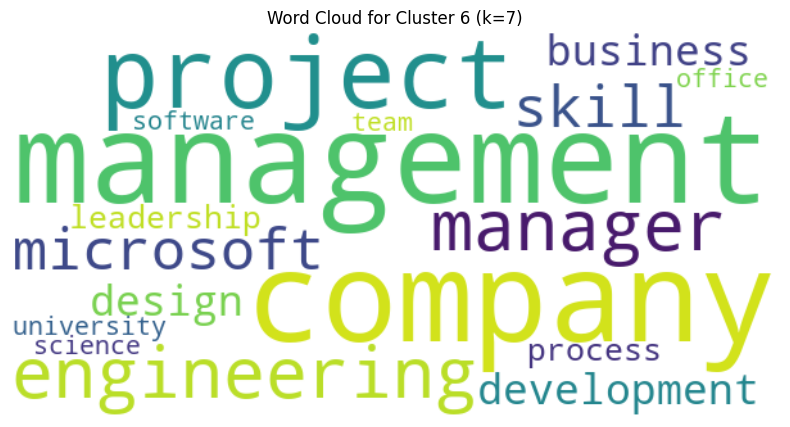


===== Analysis for k=8 =====

Cluster 0: learning, machine, technology, data, software, engineer, 2020, 2019, deep, python
  -> Saved word cloud to: ../docs/KMeans/K8/cluster_0.png


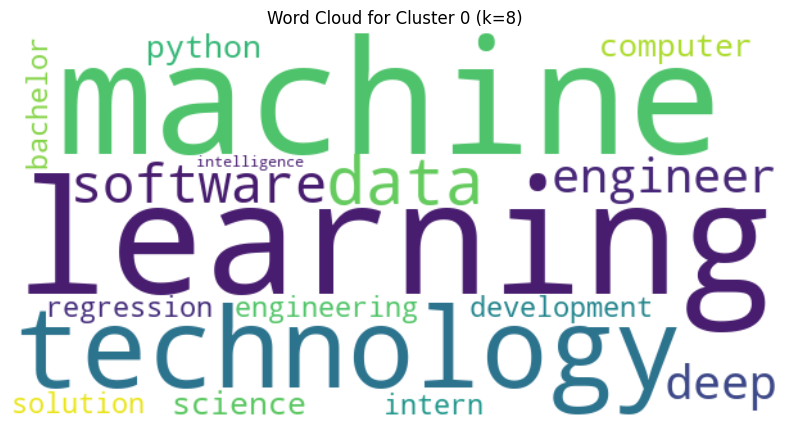


Cluster 1: company, engineering, management, project, engineer, quality, mechanical, electrical, january, microsoft
  -> Saved word cloud to: ../docs/KMeans/K8/cluster_1.png


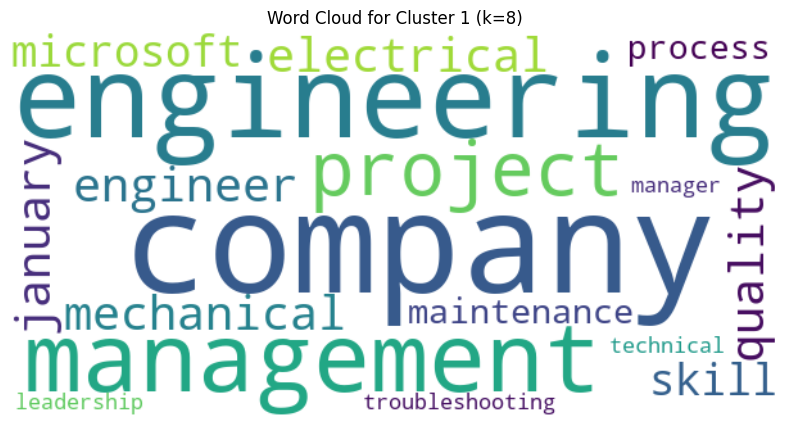


Cluster 2: sale, marketing, management, company, business, development, customer, manager, 01, relationship
  -> Saved word cloud to: ../docs/KMeans/K8/cluster_2.png


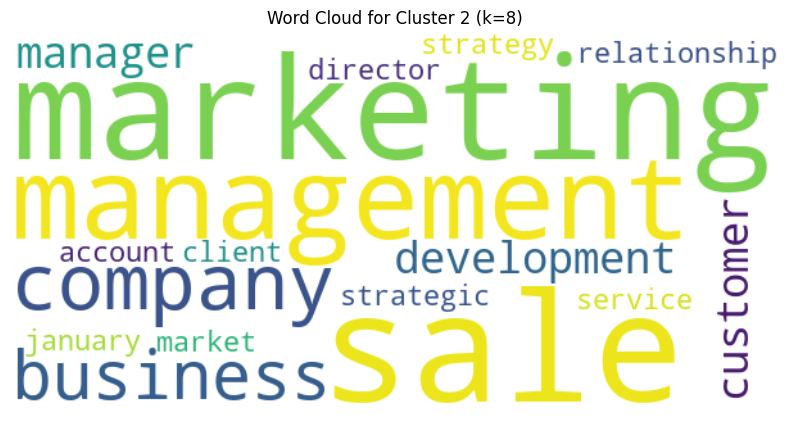


Cluster 3: computer, science, software, university, window, visual, engineer, javascript, 20xx, technology
  -> Saved word cloud to: ../docs/KMeans/K8/cluster_3.png


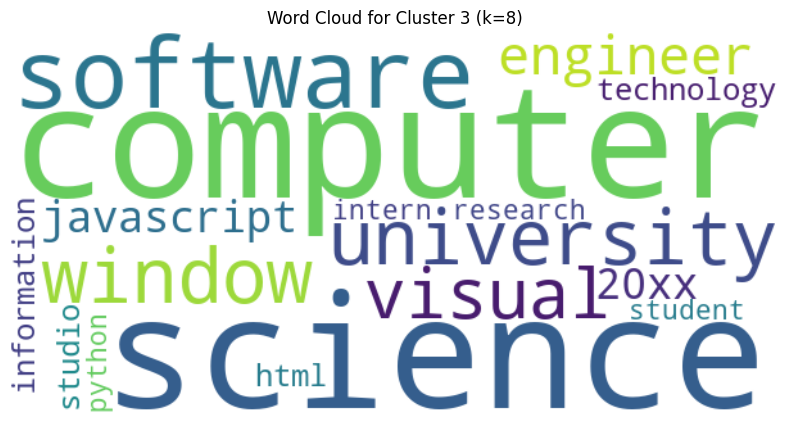


Cluster 4: data, analysis, learning, machine, business, 2020, analytics, 2019, python, model
  -> Saved word cloud to: ../docs/KMeans/K8/cluster_4.png


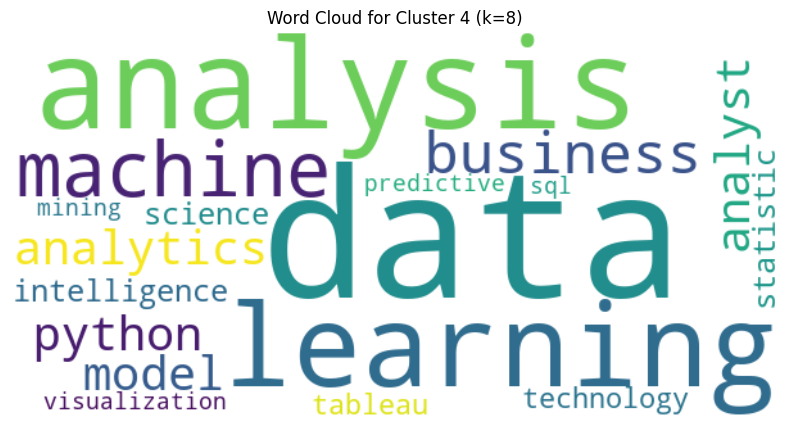


Cluster 5: processing, learning, language, natural, data, machine, 2019, python, technology, analytics
  -> Saved word cloud to: ../docs/KMeans/K8/cluster_5.png


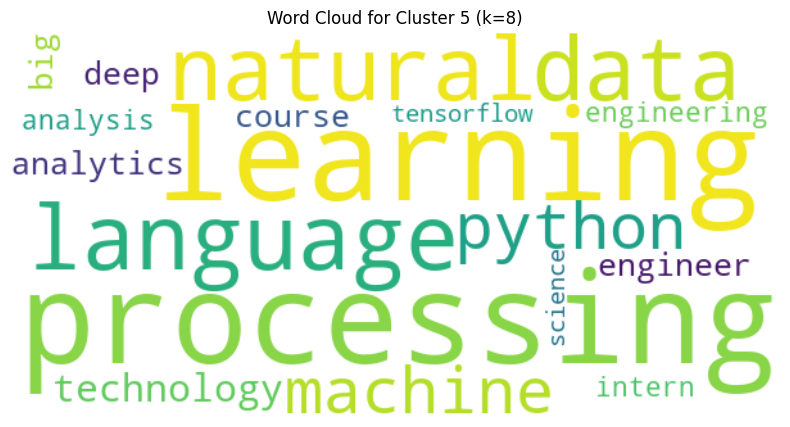


Cluster 6: manufacturing, engineering, process, lean, design, company, improvement, mircrosoft, 01, quality
  -> Saved word cloud to: ../docs/KMeans/K8/cluster_6.png


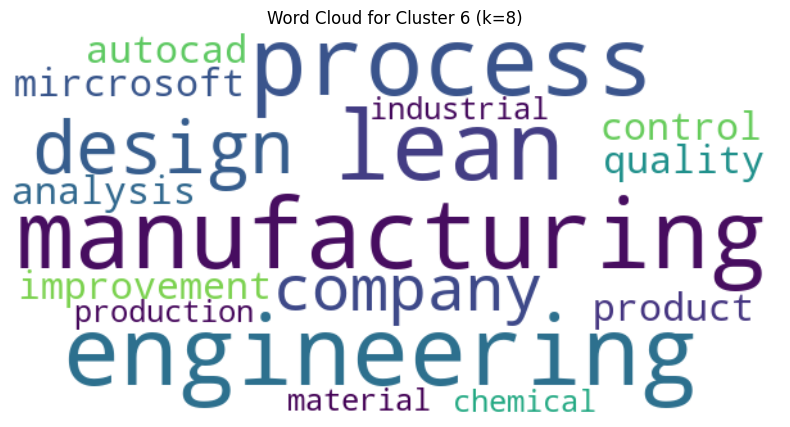


Cluster 7: accounting, financial, accountant, account, company, tax, reconciliation, ledger, statement, general
  -> Saved word cloud to: ../docs/KMeans/K8/cluster_7.png


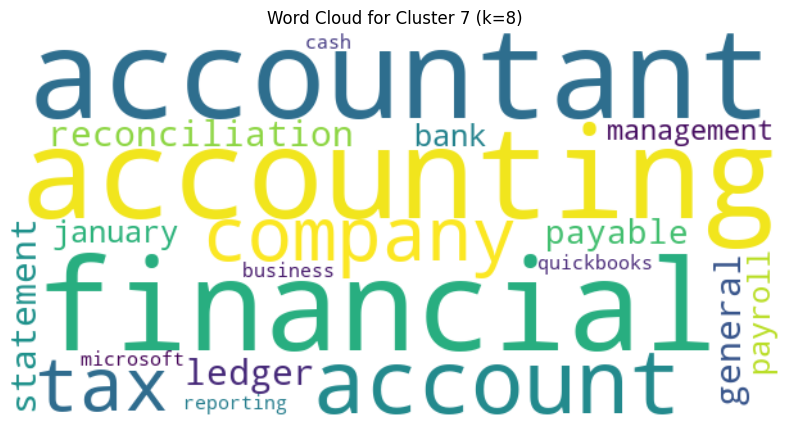


===== Analysis for k=9 =====

Cluster 0: learning, data, machine, 2018, big, 2020, science, analysis, regression, deep
  -> Saved word cloud to: ../docs/KMeans/K9/cluster_0.png


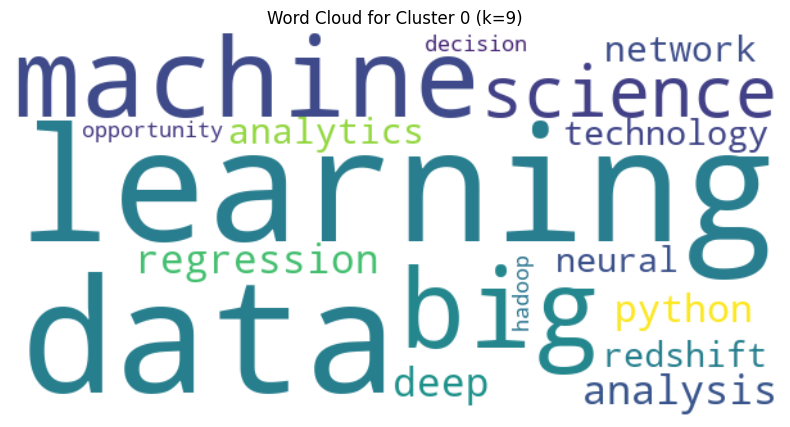


Cluster 1: sale, company, management, marketing, business, manager, development, customer, 01, january
  -> Saved word cloud to: ../docs/KMeans/K9/cluster_1.png


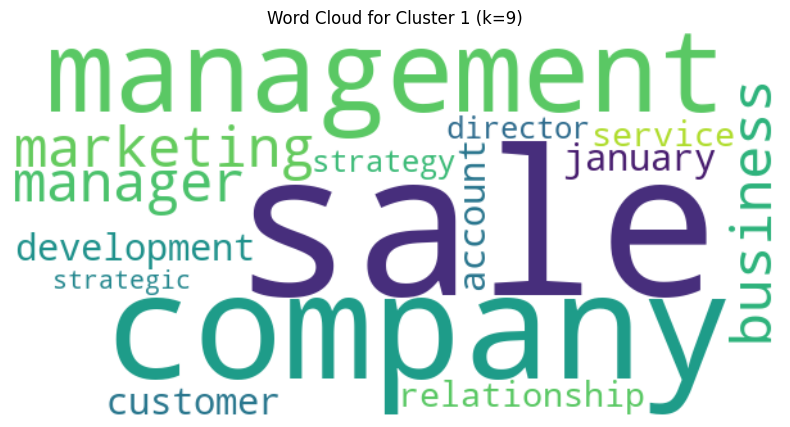


Cluster 2: window, company, software, test, microsoft, scrum, engineering, network, support, assurance
  -> Saved word cloud to: ../docs/KMeans/K9/cluster_2.png


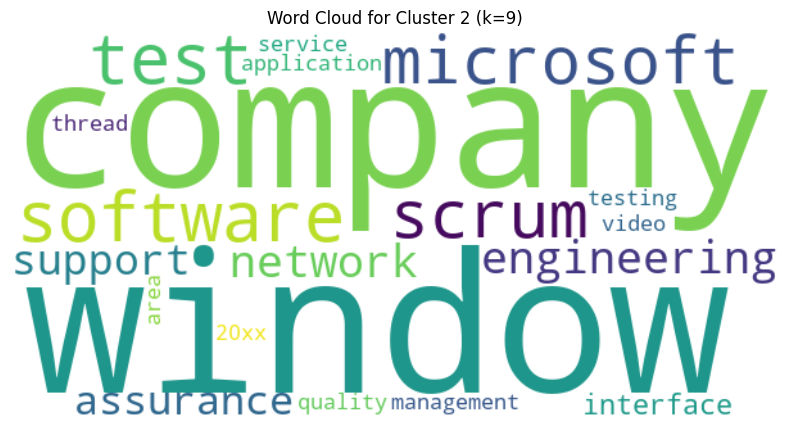


Cluster 3: company, engineering, management, engineer, project, process, 01, mechanical, electrical, quality
  -> Saved word cloud to: ../docs/KMeans/K9/cluster_3.png


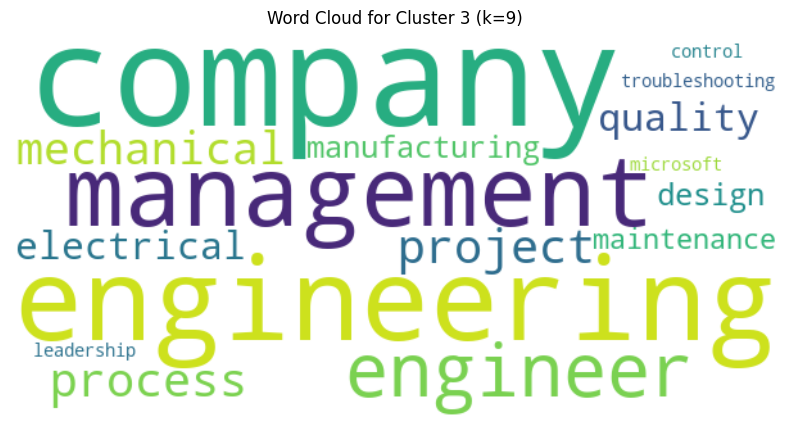


Cluster 4: processing, data, natural, language, learning, machine, 2019, analytics, python, technology
  -> Saved word cloud to: ../docs/KMeans/K9/cluster_4.png


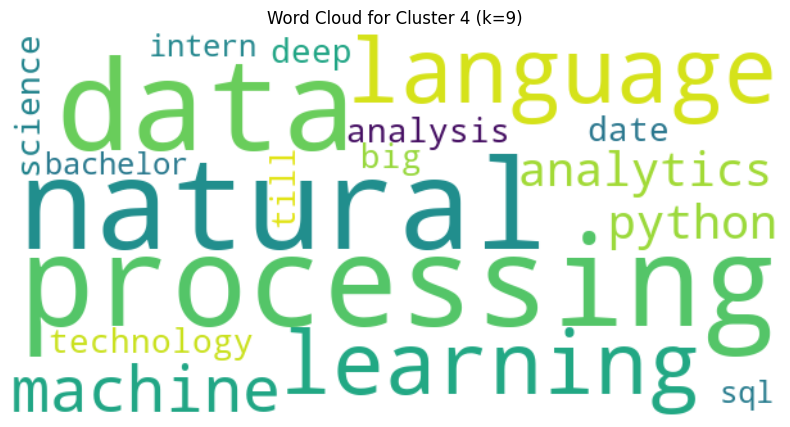


Cluster 5: accounting, financial, accountant, account, company, tax, reconciliation, ledger, statement, general
  -> Saved word cloud to: ../docs/KMeans/K9/cluster_5.png


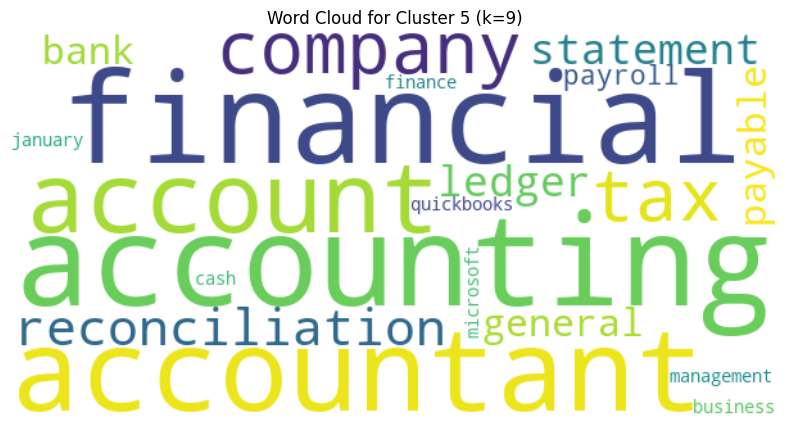


Cluster 6: computer, science, university, 2021, 2018, research, software, engineer, student, information
  -> Saved word cloud to: ../docs/KMeans/K9/cluster_6.png


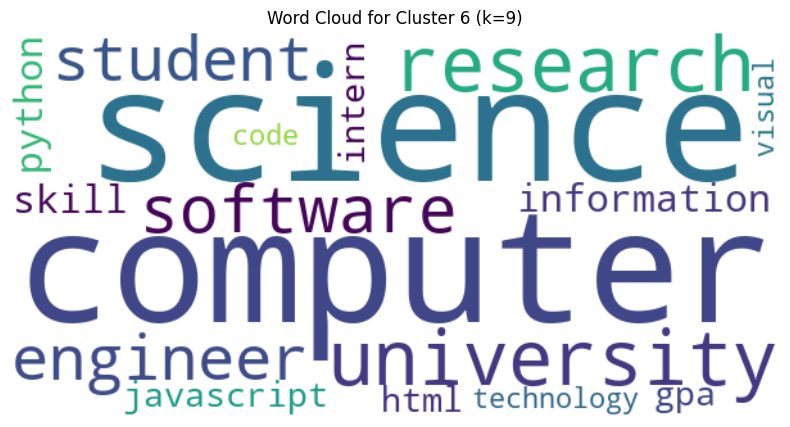


Cluster 7: data, learning, analysis, machine, 2020, business, 2019, analytics, python, analyst
  -> Saved word cloud to: ../docs/KMeans/K9/cluster_7.png


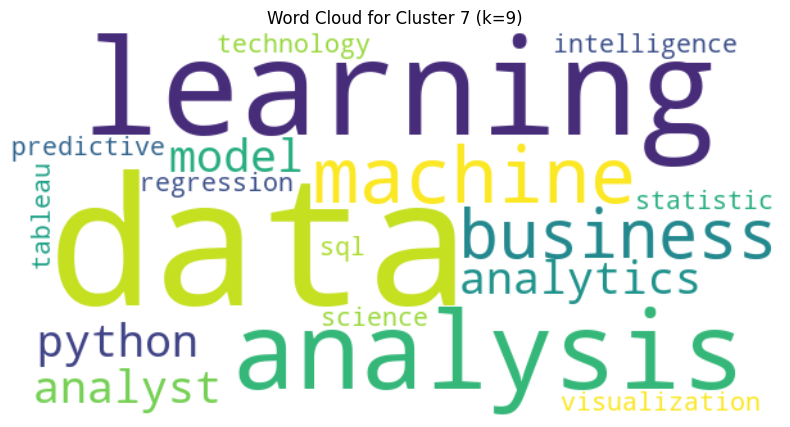


Cluster 8: learning, machine, software, technology, engineer, 2019, deep, python, data, 2020
  -> Saved word cloud to: ../docs/KMeans/K9/cluster_8.png


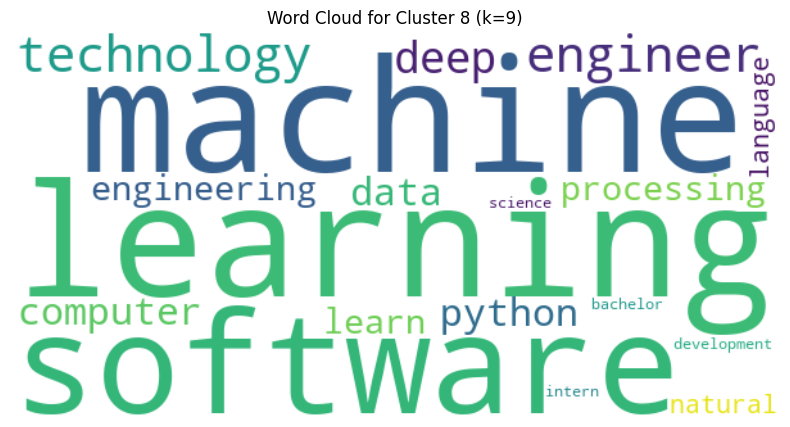


===== Analysis for k=10 =====

Cluster 0: interface, thread, json, software, video, oop, editing, scrum, class, xml
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_0.png


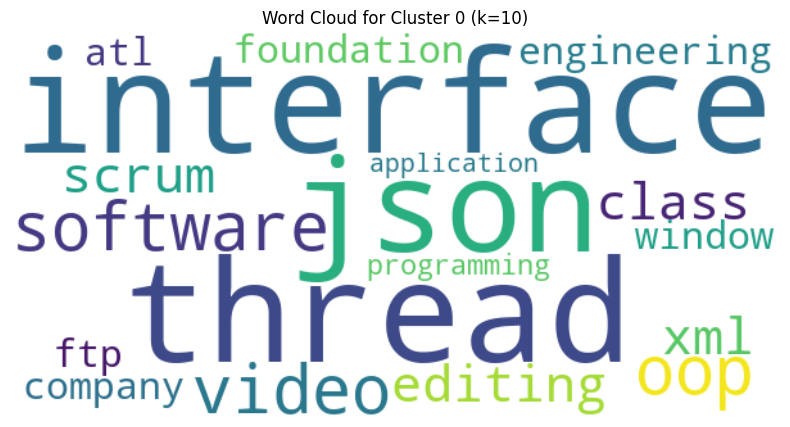


Cluster 1: learning, machine, technology, deep, 2020, python, data, engineer, 2019, computer
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_1.png


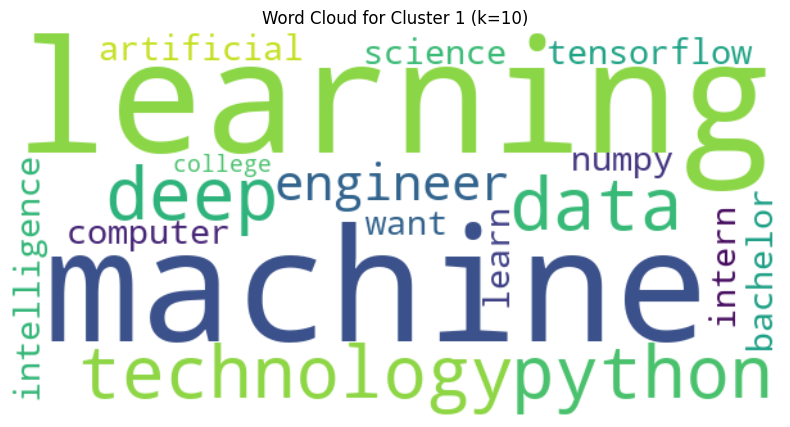


Cluster 2: company, engineering, quality, engineer, troubleshooting, management, manufacturing, testing, electrical, test
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_2.png


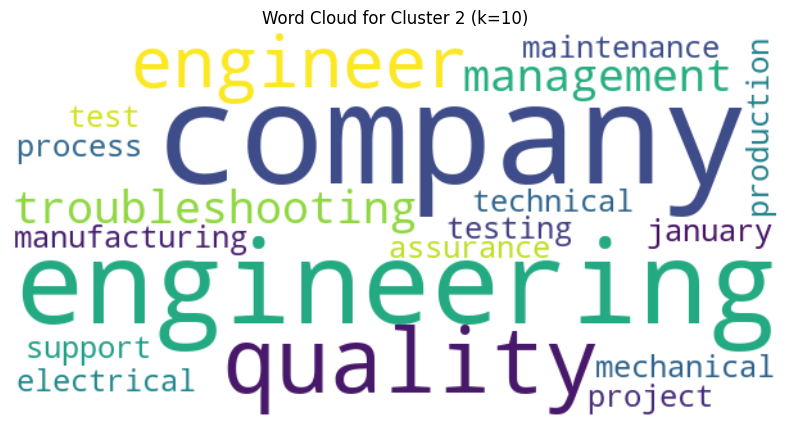


Cluster 3: accounting, financial, accountant, account, company, tax, reconciliation, ledger, statement, general
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_3.png


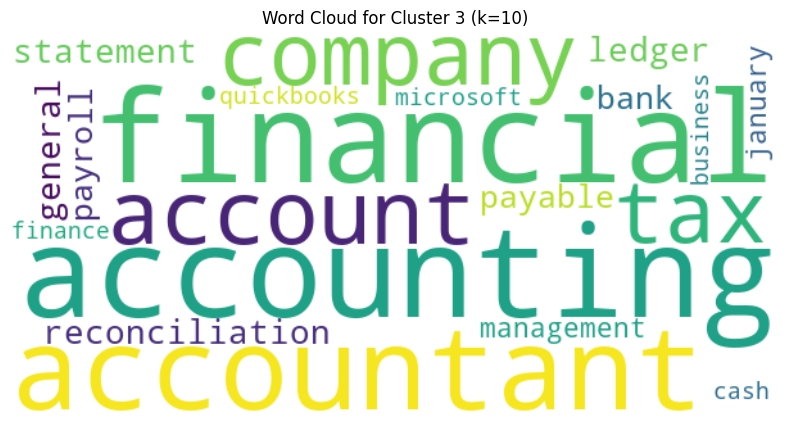


Cluster 4: processing, language, natural, learning, data, machine, 2019, python, technology, deep
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_4.png


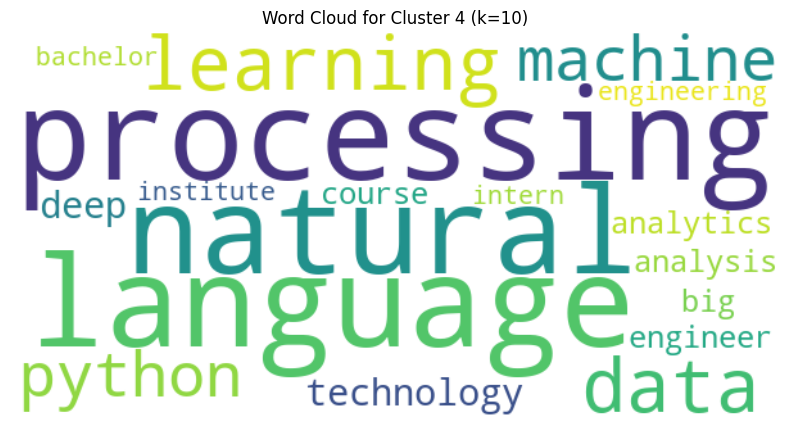


Cluster 5: company, management, sale, marketing, business, manager, development, customer, 01, service
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_5.png


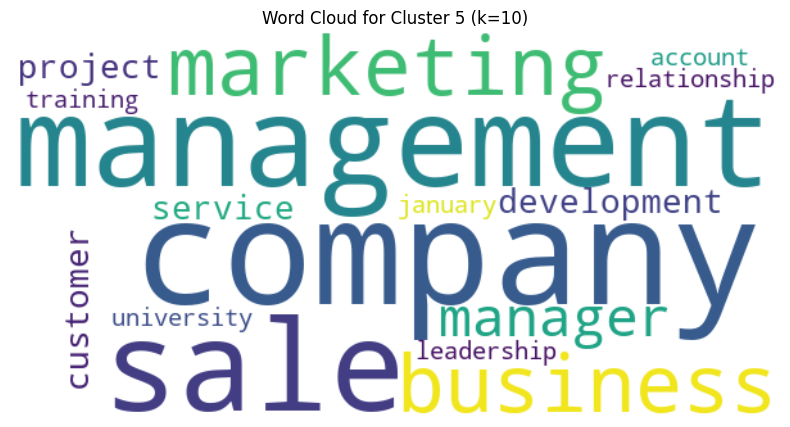


Cluster 6: science, computer, university, 20xx, 2021, student, research, javascript, gpa, engineer
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_6.png


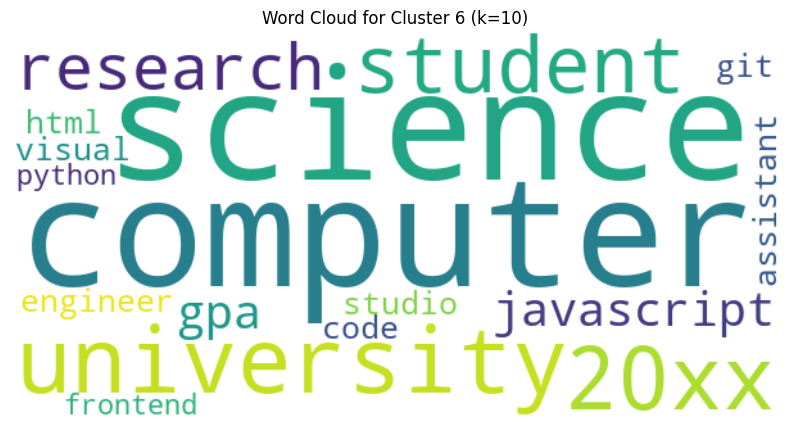


Cluster 7: engineering, company, design, mechanical, office, process, autocad, mircrosoft, project, gpa
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_7.png


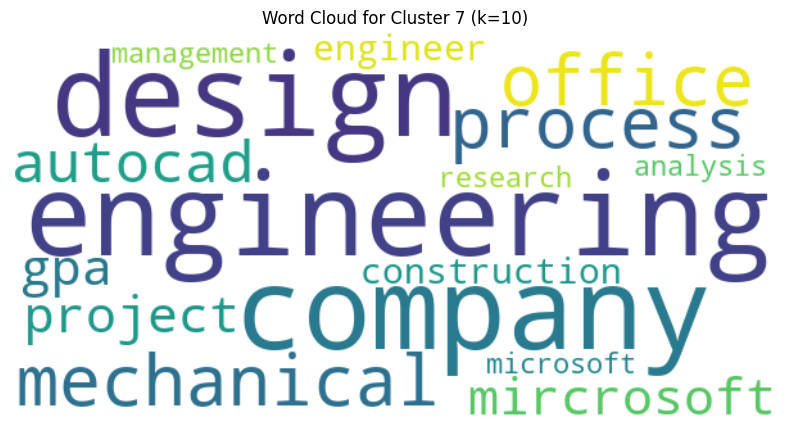


Cluster 8: data, learning, analysis, machine, 2020, business, analytics, intelligence, analyst, python
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_8.png


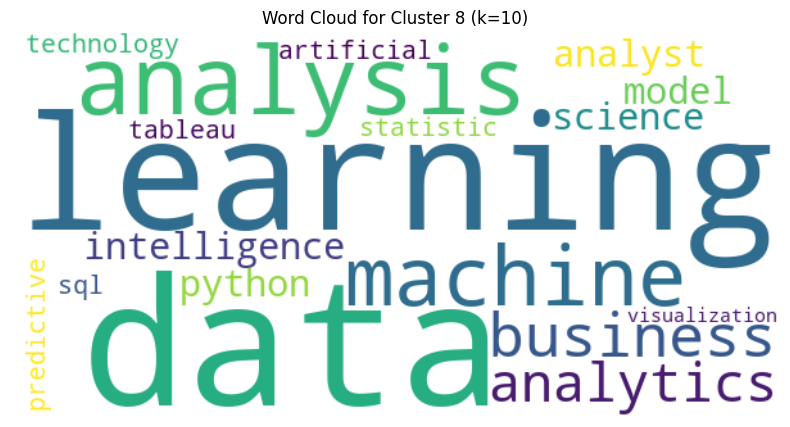


Cluster 9: software, learning, machine, 2019, data, technology, engineer, python, development, 2020
  -> Saved word cloud to: ../docs/KMeans/K10/cluster_9.png


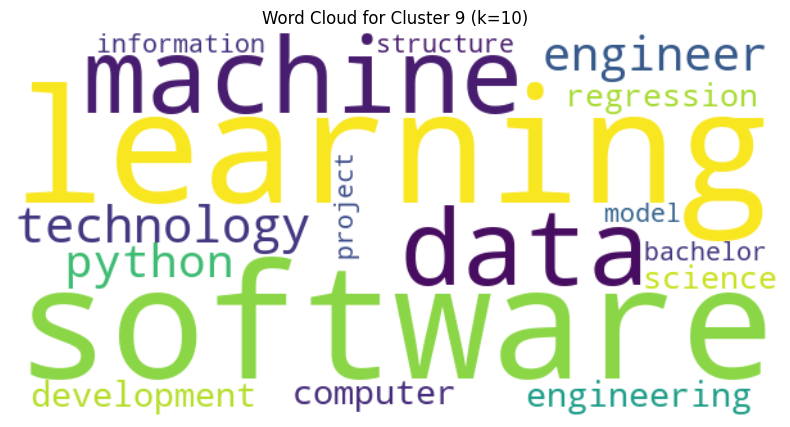

In [ ]:
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=42)
    kmeans.fit(resume_tfidf)
    plot_and_save_cluster_word_clouds(kmeans, tfidf, k)

From K Means:
Cluster = 6 is giving good results. The clusters are distinct with good differences between the clusters as observed from the word clouds.
The distinct cluster characteristics are:
1. Front end developer resumes.
2. Data analysit resumes.
3. Engineering dept
4. Finance related
5. Management and sales related
6. Data science related

Running HAC on a sample of data points.


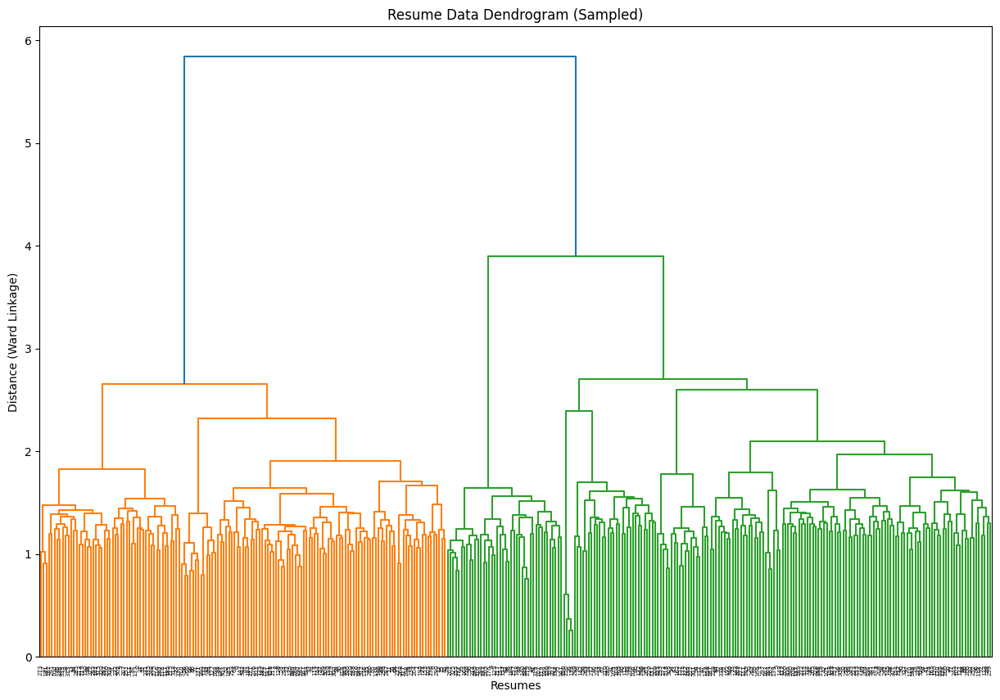

In [166]:
# sample_size = 500
# df_sample = df.sample(n=sample_size, random_state=42)
pca_sample = resume_pca_matrix

print(f"Running HAC on a sample of data points.")
plt.figure(figsize=(15, 10))
plt.title("Resume Data Dendrogram (Sampled)")
plt.xlabel("Resumes")
plt.ylabel("Distance (Ward Linkage)")

dend = shc.dendrogram(shc.linkage(pca_sample, method='ward'))
plt.show()

In [167]:
resume_pca_matrix

array([[ 0.17814466,  0.0226223 ,  0.12348966, ..., -0.0723713 ,
         0.03654259,  0.01460827],
       [ 0.30544739,  0.11820482,  0.31765563, ..., -0.00103769,
        -0.01293873,  0.05651367],
       [ 0.16997395, -0.04651163, -0.17813754, ...,  0.03013732,
        -0.01964134,  0.01659452],
       ...,
       [-0.25954713,  0.19535628,  0.02405191, ...,  0.02548976,
        -0.02219348, -0.0712837 ],
       [ 0.25819723,  0.02523278,  0.10460016, ...,  0.05787094,
        -0.04451744,  0.04740833],
       [ 0.22829982, -0.01253447, -0.04017614, ..., -0.0184506 ,
         0.00899469, -0.01186719]], shape=(344, 309))

In [168]:
resume_texts

,resume_text,Resume_Cluster_KMeans
0,big data analytics working database warehouse ...,1
1,fresher looking join associate science data an...,1
2,software development machine learning deep lea...,5
3,obtain position fastpaced business office envi...,3
4,professional accountant outstanding work ethic...,3
...,...,...
339,fresher starting wanting join role machine lea...,5
340,automation budget interpersonal computer liter...,2
341,business management graduate significant exper...,3
342,software engineering sdlc data handling data w...,1


In [179]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=42)
resume_labels = kmeans.fit_predict(resume_tfidf)

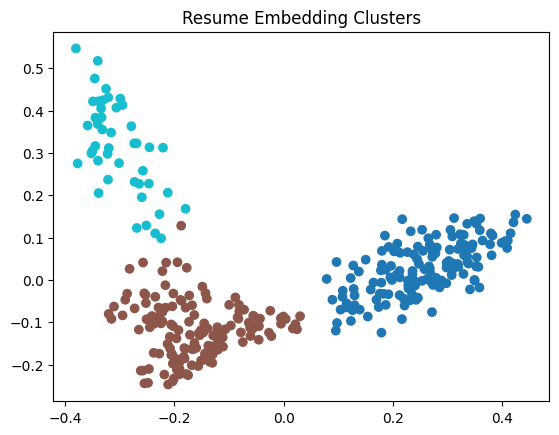

In [180]:
import matplotlib.pyplot as plt
plt.scatter(resume_pca_matrix[:,0], resume_pca_matrix[:,1], c=resume_labels, cmap='tab10')
plt.title('Resume Embedding Clusters')
plt.show()

In [182]:
# Merge the cluster labels back to the original dataframe
data_df = data_df.merge(resume_texts[['resume_text', 'Resume_Cluster_KMeans']], on='resume_text', how='left')

In [207]:
data_df.to_csv("final_data.csv", index=False)

In [184]:
from sklearn.metrics import pairwise_distances

In [185]:
# We use a new vectorizer to learn the vocabulary of both resumes and jobs
sim_vectorizer = TfidfVectorizer(stop_words='english', min_df=2)

# Fit on the combined corpus of all resume and job text
all_text = pd.concat([data_df['resume_text'], data_df['jobs_text']], axis=0)
sim_vectorizer.fit(all_text)

# Transform resume and job texts separately using the learned vocabulary
resume_vecs = sim_vectorizer.transform(data_df['resume_text'])
job_vecs = sim_vectorizer.transform(data_df['jobs_text'])

# Calculate cosine similarity row-by-row and add it as a feature
data_df['Cosine_Similarity'] = 1 - pairwise_distances(resume_vecs, job_vecs, metric='cosine').diagonal()
    
print("Added the final 'Cosine_Similarity' feature.")
display(data_df[['Cosine_Similarity', 'Resume_Cluster_KMeans']].head())


Added the final 'Cosine_Similarity' feature.


,Cosine_Similarity,Resume_Cluster_KMeans
0,0.014005,1
1,0.246826,1
2,0.000000,5
3,0.014274,3
4,0.004346,3


<Axes: xlabel='Cosine_Similarity', ylabel='Count'>

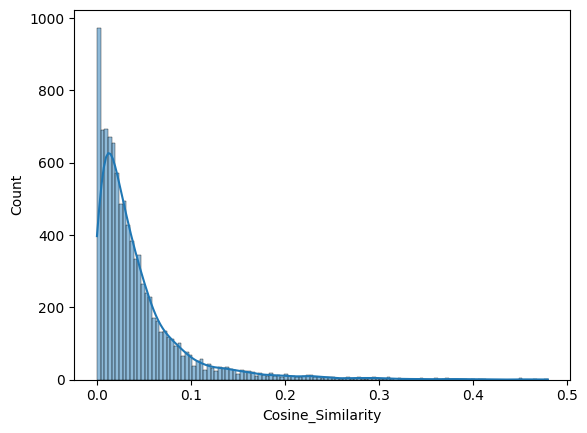

In [186]:
sns.histplot(data_df['Cosine_Similarity'], kde=True)

### Train test split

In [209]:
data_df.columns

Index(['career_objective', 'skills', 'educational_institution_name',
       'degree_names', 'passing_years', 'educational_results', 'result_types',
       'major_field_of_studies', 'professional_company_names', 'start_dates',
       'end_dates', 'related_skils_in_job', 'positions', 'responsibilities',
       'extra_curricular_activity_types',
       'extra_curricular_organization_names', 'role_positions', 'languages',
       'proficiency_levels', 'certification_providers', 'certification_skills',
       'job_position_name', 'educational_requirements',
       'experiencere_requirement', 'age_requirement', 'skills_required',
       'matched_score', 'resume_id', 'resume_text', 'job_id', 'jobs_text',
       'total_experience', 'min_experience_required', 'skills_matching_ratio',
       'matching_words_count', 'Resume_Cluster_KMeans', 'Cosine_Similarity'],
      dtype='object')

In [210]:
store_columns = [
    'resume_id', 'job_id', 'matched_score', 'resume_text', 'jobs_text',
    'skills_matching_ratio', 'matching_words_count', 'total_experience',
    'min_experience_required', 'Resume_Cluster_KMeans', 'Cosine_Similarity'
]
store_data = data_df[store_columns]
store_data.to_csv("final_data_with_features.csv", index=False)

In [194]:
final_data = data_df[['resume_id', 'job_id', 'matched_score', 'resume_text', 'jobs_text']]

In [196]:
all_features = ["jobs_text", "resume_text"]

In [198]:
predictors = final_data[all_features]

In [197]:
tfidf = TfidfVectorizer(stop_words='english')
preprocessor = ColumnTransformer(
    transformers=[(col, Pipeline([('tfidf', tfidf)]), col) for col in all_features]
)

In [199]:
X = preprocessor.fit_transform(predictors)
y = final_data['matched_score'].values

In [200]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [201]:
model = Ridge()
model.fit(X_train, y_train)

,alpha,1.0
,fit_intercept,True
,copy_X,True
,max_iter,None
,tol,0.0001
,solver,'auto'
,positive,False
,random_state,None


In [202]:
y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

rmse, mae, r2

(np.float64(0.12056685384596125), 0.0931782523513788, 0.4743370263819715)

In [203]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

,n_estimators,100
,criterion,'squared_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [204]:
y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

rmse, mae, r2

(np.float64(0.09781053995934089), 0.07176080602058843, 0.6540424253912744)

## Using all features

Not required:
Skill matching ratio
Cluster Number

In [211]:
from sklearn.preprocessing import StandardScaler

In [320]:
final_data = data_df[['matched_score', 'resume_text', 'jobs_text','skills_matching_ratio', 'matching_words_count', 'total_experience',
    'min_experience_required', 'Cosine_Similarity']]

In [322]:
target = "matched_score"
text_features = ["resume_text", "jobs_text"]
numerical_cols = []

In [310]:
X_train, X_test, y_train, y_test = train_test_split(
    final_data.drop(columns=[target]), final_data[target], test_size=0.2, random_state=42
)

In [311]:
preprocessor = ColumnTransformer(
    transformers=[
        ("resume_tfidf", TfidfVectorizer(), "resume_text"),
        ("jobs_tfidf", TfidfVectorizer(), "jobs_text"),
        ("num", StandardScaler(), numerical_cols)
    ],
    remainder='drop',
    verbose_feature_names_out=False
)

In [219]:
models = {
    "Ridge": Ridge(),
    "RandomForest": RandomForestRegressor(random_state=42)
}

In [220]:
results = {}
for model_name, model in models.items():
    pipeline = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("regressor", model)
    ])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    results[model_name] = {
        "RMSE": np.sqrt(mean_squared_error(y_test, y_pred)),
        "R2": r2_score(y_test, y_pred),
        "MAE": mean_absolute_error(y_test, y_pred)
    }

results

{'Ridge': {'RMSE': np.float64(0.11075381412450007),
  'R2': 0.5564231080630591,
  'MAE': 0.08507424543841008},
 'RandomForest': {'RMSE': np.float64(0.1029802036099368),
  'R2': 0.6165056028837932,
  'MAE': 0.07620429701349972}}

In [323]:
resume_vectorizer = TfidfVectorizer()
jobs_vectorizer = TfidfVectorizer()

# Fit and transform TF-IDF features
resume_tfidf = resume_vectorizer.fit_transform(final_data["resume_text"])
jobs_tfidf = jobs_vectorizer.fit_transform(final_data["jobs_text"])

In [324]:
scaler = StandardScaler()
numeric_data = scaler.fit_transform(final_data[numerical_cols])

ValueError: at least one array or dtype is required

In [325]:
from scipy.sparse import hstack

X_combined = hstack([resume_tfidf, jobs_tfidf])
y = final_data["matched_score"]

In [326]:
X_train, X_test, y_train, y_test = train_test_split(
    X_combined, y, test_size=0.2, random_state=42
)

In [327]:
model = Ridge()
model.fit(X_train, y_train)

,alpha,1.0
,fit_intercept,True
,copy_X,True
,max_iter,None
,tol,0.0001
,solver,'auto'
,positive,False
,random_state,None


In [328]:
y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

rmse, mae, r2

(np.float64(0.12057013959212931), 0.09317219161332371, 0.4743083747487681)

In [ ]:
(np.float64(0.11126760547904405), 0.08574369829148402, 0.5522980202473647)


In [ ]:
(np.float64(0.11127590349391424), 0.08575210466751736, 0.5522312411305181)


In [ ]:
(np.float64(0.11197531640979512), 0.08604346735298868, 0.5465847451979077)


In [ ]:
(np.float64(0.11075289852648612), 0.08507331517010454, 0.5564304421028976)


In [332]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

,n_estimators,100
,criterion,'squared_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [333]:
y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

rmse, mae, r2

(np.float64(0.09711072179449941), 0.07119527537476615, 0.6589752532026787)

In [ ]:
(np.float64(0.10263978716951136), 0.07541058373245722, 0.6190368083077726)


In [ ]:
(np.float64(0.1031724354834598), 0.0761627105592762, 0.6150725380845448)


In [329]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [330]:
y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

rmse, mae, r2

(np.float64(0.1207629293116707), 0.09324902222310474, 0.47262588573106123)

In [ ]:
(np.float64(0.11149121259161389), 0.0857989228943386, 0.5504967783116936)


In [ ]:
(np.float64(0.11261633231329224), 0.08679066962006866, 0.5413786280226828)


In [ ]:
(np.float64(0.11149122729925526), 0.08579899143994016, 0.5504966597170087)


In [ ]:
(np.float64(0.11221528380374701), 0.08615278489876764, 0.5446392903052462)


In [265]:
(np.float64(0.11097856747468339), 0.08515683475788142, 0.5546209751156473)


(np.float64(0.11097856747468339), 0.08515683475788142, 0.5546209751156473)

In [304]:
from sklearn.svm import SVR

model = SVR(kernel='linear', C=1.0, epsilon=0.1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

rmse, mae, r2

(np.float64(0.11244591203993666), 0.08699366155294333, 0.5427656247422293)

In [ ]:
(np.float64(0.114102584975881), 0.08831763299269407, 0.5291934484015725)


In [331]:
from sklearn.ensemble import AdaBoostRegressor
model = AdaBoostRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse, mae, r2

(np.float64(0.15829945001337817), 0.13592586347046273, 0.09382861724472191)

In [ ]:
(np.float64(0.1497294428170225), 0.12763648742520453, 0.1892892200244376)


In [ ]:
(np.float64(0.14701971137506414), 0.125366390767009, 0.21836740342156158)


In [ ]:
(np.float64(0.15159832989983285), 0.12998327280017233, 0.16892471987438007)


In [ ]:
(np.float64(0.14946351461903973), 0.12817573980487937, 0.19216640171698718)


In [ ]:
(np.float64(0.14761473055315172), 0.12584136947972369, 0.21202774282478742)